In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 35
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mae"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 90.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 32]
CONV2D_SIZE = ["(7, 7)", "(8, 8)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (90.0 percentile): 3.90
Number of outliers (|value| > 11.69): 654
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


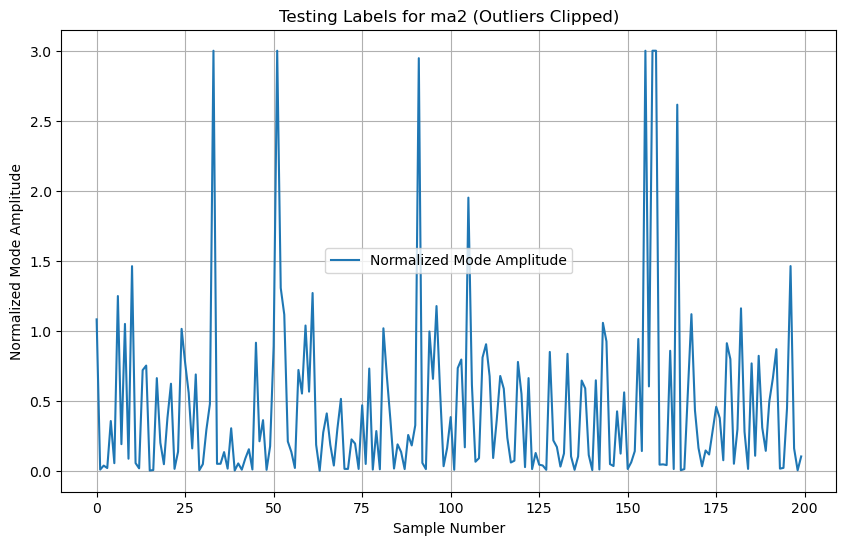

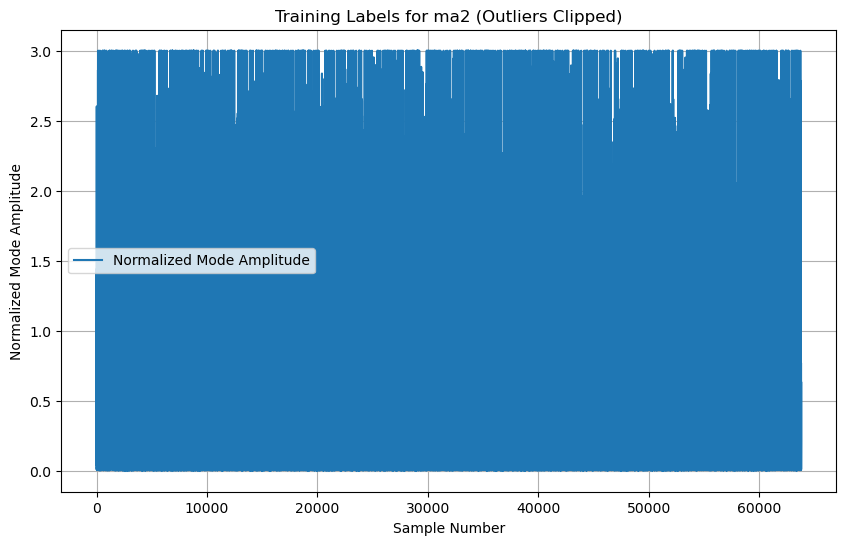

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 32)     │       131,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 13, 13, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 5408)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       173,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 307,425 (1.17 MB)

 Trainable params: 307,425 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 4:36 154ms/step - loss: 0.4378

   2/1795 ━━━━━━━━━━━━━━━━━━━━ 1:32 52ms/step - loss: 0.3889 

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 1:19 44ms/step - loss: 0.3979

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:43 58ms/step - loss: 0.4038

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:33 52ms/step - loss: 0.4070

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:27 49ms/step - loss: 0.4144

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:24 47ms/step - loss: 0.4184

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:22 46ms/step - loss: 0.4185

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:20 45ms/step - loss: 0.4174

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:19 45ms/step - loss: 0.4172

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:18 44ms/step - loss: 0.4167

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:17 44ms/step - loss: 0.4163

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:15 43ms/step - loss: 0.4158

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.4149

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.4141

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.4131

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.4121

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.4108

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 40ms/step - loss: 0.4093

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.4077

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.4062

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.4045

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 39ms/step - loss: 0.4028

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.4013

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.4000

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 38ms/step - loss: 0.3987

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.3974

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 38ms/step - loss: 0.3963

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.3952

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.3942

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 37ms/step - loss: 0.3933

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3923

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3914

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3907

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3900

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3895

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3888

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3882

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3876

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3871

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3865

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3859

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3853

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3849

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 36ms/step - loss: 0.3844

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3840

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3837

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3833

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3829

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3826

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3822

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3819

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3815

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3811

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3808

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3804

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 37ms/step - loss: 0.3801

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.3797

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.3793

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3789

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3786

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3783

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3780

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 37ms/step - loss: 0.3777

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3773

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3770

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3767

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3763

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3760

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3757

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 37ms/step - loss: 0.3754

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3751

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3749

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3746

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3743

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3740

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3737

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 37ms/step - loss: 0.3735

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 37ms/step - loss: 0.3732 

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3729

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3727

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3725

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3722

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3720

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3718

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 36ms/step - loss: 0.3716

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3714

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3712

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3710

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3708

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3706

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3705

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3703

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 36ms/step - loss: 0.3701

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3699

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3697

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3695

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3694

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3692

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3690

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3688

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3686

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3685

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3683

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3681

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 36ms/step - loss: 0.3680

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3678

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3676

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3675

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3673

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3672

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3670

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3668

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3667

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 36ms/step - loss: 0.3665

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3664

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3662

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3661

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3659

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3657

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3656

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3654

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3653

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 36ms/step - loss: 0.3651

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3650

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3648

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3647

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3645

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3644

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3643

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3641

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3640

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3639

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3637

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 35ms/step - loss: 0.3636

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3635

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3634

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3633

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3631

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3630

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3629

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3628

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3627

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3626

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3625

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3624

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3623

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 35ms/step - loss: 0.3622

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3621

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3620

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3619

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3618

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3617

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3616

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3615

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3614

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3613

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3612

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3611

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3610

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3609

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 35ms/step - loss: 0.3608

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3607

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3606

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3605

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3604

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3603

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3602

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3601

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3600

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3599

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3598

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3597

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3596

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3595

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 35ms/step - loss: 0.3595

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3594

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3593

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3592

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3591

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3590

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3589

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3588

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3587

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3586

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3585

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3584

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3584

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 35ms/step - loss: 0.3583

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3582

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3581

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3580

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3579

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3579

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3578

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3577

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3576

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3575

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3574

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3574

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 35ms/step - loss: 0.3573

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3572

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3571

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3570

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3569

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3569

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3568

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3567

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3566

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3565

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3564

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3564

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3563

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3562

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3561

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 35ms/step - loss: 0.3560

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3560

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3559

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3558

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3557

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3556

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3555

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3555

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3554

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3553

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3552

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3551

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3551

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3550

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 35ms/step - loss: 0.3549

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3548

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3547

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3546

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3545

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3545

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3544

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3543

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3542

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3541

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3540

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3540

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3539

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3538

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3537

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3536

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 35ms/step - loss: 0.3535

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3534

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3534

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3533

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3532

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3531

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3530

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3529

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3529

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3528

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3527

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3526

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3525

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3525

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3524

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 35ms/step - loss: 0.3523

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3522

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3521

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3521

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3520

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3519

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3518

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3517

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3517

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3516

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3515

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3514

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3514

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3513

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 35ms/step - loss: 0.3512

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3512

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3511

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3510

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3509

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3509

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3508

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3507

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3507

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3506

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3505

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3504

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3504

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3503

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3502

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3502

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3501

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.3500

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3500

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3499

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3498

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3498

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3497

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3496

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3496

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3495

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3494

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3494

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3493

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3493

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3492

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 35ms/step - loss: 0.3491

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3491

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3490

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3489

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3489

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3488

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3487

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3487

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3486

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3486

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3485

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3484

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3484

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3483

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - loss: 0.3483

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3482

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3481

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3481

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3480

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3480

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3479

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3479

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3478

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3477

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3477

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3476

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3476

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3475

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - loss: 0.3475

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3474

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3474

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3473

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3473

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3472

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3472

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3471

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3471

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3470

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3470

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3469

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3469

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3468

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - loss: 0.3468

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3467

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3467

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3466

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3466

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3465

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3465

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3464

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3464

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3463

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3463

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3462

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3462

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3461

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 35ms/step - loss: 0.3461

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3460

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3460

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3460

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3459

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3459

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3458

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3458

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3457

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3457

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3456

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3456

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3456

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.3455

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3455

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.3454

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.3454

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3453

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3453

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3453

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3452

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3452

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3451

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3451

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3451

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3450

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3450

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3449

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3449

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 36ms/step - loss: 0.3448

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3448

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3448

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3447

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3447

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3447

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3446

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3446

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3445

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3445

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3445

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3444

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3444

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3443

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.3443

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3443

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3442

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3442

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3441

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3441

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3441

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3440

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3440

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3440

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3439

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3439

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3438

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3438

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.3438

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3437

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3437

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3436

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3436

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3436

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3435

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3435

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3434

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3434

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3434

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3433

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3433

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3432

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3432

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.3432

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3432

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3431

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3431

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3430

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3430

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3430

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3429

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3429

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3428

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3428

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3428

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3427

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3427

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3427

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 36ms/step - loss: 0.3426

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3426

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3425

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3425

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3425

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3424

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3424

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3423

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3423

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3423

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3422

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3422

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3422

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - loss: 0.3421

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3421

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3420

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.3420

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 35ms/step - loss: 0.3420

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3419

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3419

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3419

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3418

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3418

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3418

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3417

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3417

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3416

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3416

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 36ms/step - loss: 0.3416

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3415

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3415

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3414

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3414

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3414

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3413

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3413

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3413

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3412

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3412

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3411

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3411

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3411

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3410

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 36ms/step - loss: 0.3410

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3410

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3409

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3409

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3408

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3408

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3408

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3407

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3407

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3407

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3406

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3406

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3405

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3405

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 36ms/step - loss: 0.3405

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3404

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3404

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3404

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3403

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3403

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3402

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3402

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3402

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3401

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3401

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3401

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3400

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3400

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3400

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 36ms/step - loss: 0.3399

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3399

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3398

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3398

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3398

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3397

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3397

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3397

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3396

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3396

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3396

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3395

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3395

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3395

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - loss: 0.3394

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3394

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3394

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3393

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3393

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3393

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3392

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3392

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3392

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3391

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3391

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3390

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3390

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3390

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - loss: 0.3389

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3389

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3389

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3388

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3388

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3388

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3387

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3387

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3387

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3386

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3386

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3386

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3385

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - loss: 0.3385

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3385

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3384

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3384

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3384

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3383

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3383

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3383

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3382

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3382

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3381

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3381

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3381

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3380

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - loss: 0.3380

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3380

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3379

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3379

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3379

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3378

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3378

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3378

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3377

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3377

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3377

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3376

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3376

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3376

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - loss: 0.3375

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3375

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3375

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3374

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3374

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3374

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3373

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3373

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3373

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3372

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3372

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3372

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3371

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3371

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - loss: 0.3371

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3370

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3370

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3370

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3369

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3369

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3369

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3368

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3368

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3368

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3367

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3367

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3367

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3366

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.3366

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3366

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3365

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3365

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3365

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3364

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3364

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3364

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3363

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3363

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3363

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3362

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3362

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3362

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3362

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3361

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 36ms/step - loss: 0.3361

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3361

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3360

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3360

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3360

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3359

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3359

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3359

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3358

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3358

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3358

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3357

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3357

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3357

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 36ms/step - loss: 0.3356

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3356

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3356

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3355

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3355

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3355

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3354

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3354

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3354

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3353

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3353

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3353

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3353

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3352

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.3352

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3352

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3351

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3351

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3351

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3350

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3350

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3350

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3349

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3349

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3349

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3348

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3348

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3348

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - loss: 0.3347

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3347

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3347

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3347

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3346

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3346

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3346

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3345

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3345

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3345

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3344

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3344

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3344

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3343

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 36ms/step - loss: 0.3343

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3343

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3342

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3342

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3342

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3342

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3341

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3341

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3341

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3340

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3340

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3340

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3339

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3339

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - loss: 0.3339

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3338

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3338

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3338

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3337

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3337

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3337

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3337

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3336

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3336

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3336

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3335

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3335

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3335

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 36ms/step - loss: 0.3334

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3334

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3334

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3334

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3333

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3333

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3333

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3332

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3332

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3332

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3332

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3331

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3331

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3331

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3330

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - loss: 0.3330

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3330

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3329

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3329

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3329

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3328

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3328

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3328

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3328

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3327

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3327

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3327

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3326

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3326

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.3326

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3325

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3325

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3325

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3325

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3324

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3324

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3324

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3323

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3323

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3323

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3322

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3322

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3322

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3322

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3321 

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3321

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3321

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3320

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3320

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3320

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3319

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3319

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3319

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3319

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3318

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3318

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3318

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - loss: 0.3317

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3317

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3317

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3317

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3316

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3316

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3316

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3315

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3315

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3315

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3314

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3314

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3314

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3314

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3313

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3313

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3313

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3312

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3312

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3312

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3311

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3311

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3311

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3311

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3310

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3310

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3310

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3309

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.3309

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3309

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3309

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3308

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3308

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3308

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3307

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3307

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3307

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3307

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3306

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3306

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3306

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 0.3305

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3305

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3305

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3305

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3304

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3304

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3304

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3303

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3303

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3303

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3303

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3302

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3302

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3302

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 0.3301

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3301

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3301

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3301

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3300

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3300

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3300

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3299

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3299

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3299

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3299

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3298

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3298

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3298

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.3297

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3297

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3297

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3297

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3296

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3296

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3296

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3295

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3295

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3295

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3295

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3294

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3294

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3294

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.3294

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3293

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3293

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3293

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3292

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3292

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3292

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3292

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3291

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3291

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3291

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3290

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3290

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3290

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.3290

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3289

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3289

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3289

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3289

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3288

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3288

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3288

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3287

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3287

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3287

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3287

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3286

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3286

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.3286

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3286

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3285

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3285

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3285

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3285

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3284

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3284

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3284

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3283

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3283

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3283

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3283

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3282

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3282

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 67s 37ms/step - loss: 0.3282 - val_loss: 0.2860


Epoch 2/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:34 53ms/step - loss: 0.1745

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2328

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2574

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2635

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 39ms/step - loss: 0.2649

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.2629

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.2614

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.2598

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.2597

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.2597

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.2597

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 39ms/step - loss: 0.2600

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.2598

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 40ms/step - loss: 0.2598

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2601

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2602

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2601

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2601

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2601

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.2602

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 41ms/step - loss: 0.2606

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 42ms/step - loss: 0.2610

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2611

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2613

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.2616

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 1:14 42ms/step - loss: 0.2621

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2625

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2630

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2635

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 1:13 42ms/step - loss: 0.2639

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 42ms/step - loss: 0.2643

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 42ms/step - loss: 0.2646

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 1:12 42ms/step - loss: 0.2649

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2651

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2653

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 41ms/step - loss: 0.2654

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 41ms/step - loss: 0.2656

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 41ms/step - loss: 0.2658

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 1:10 41ms/step - loss: 0.2660

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.2662

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 41ms/step - loss: 0.2663

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 40ms/step - loss: 0.2665

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 40ms/step - loss: 0.2666

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.2667

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.2668

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.2669

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 40ms/step - loss: 0.2670

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.2671

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.2672

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.2673

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 40ms/step - loss: 0.2674

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.2675

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.2677

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.2678

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.2679

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 39ms/step - loss: 0.2680

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2682

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2684

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2685

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2687

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2688

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2690

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 39ms/step - loss: 0.2691

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2693

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2694

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2695

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2697

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2699

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2700

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2702

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2703

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 39ms/step - loss: 0.2704

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2706

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2707

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2708

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2709

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2710

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2711

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2712

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 39ms/step - loss: 0.2713

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 38ms/step - loss: 0.2715

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2716

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2717

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2718

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2719

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2721

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2722

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2723

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2724

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2725

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2726

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2727

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 38ms/step - loss: 0.2728

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2730

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2731

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2732

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2732

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2733

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2734

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2735

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2736

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2737

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2738

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2739

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2740

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2740

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 38ms/step - loss: 0.2741

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2742

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2743

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2743

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2744

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2745

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2746

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2746

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2747

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2748

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2748

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 38ms/step - loss: 0.2749

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2749 

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2750

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2751

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2751

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2752

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2752

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2753

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2754

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 38ms/step - loss: 0.2754

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2755

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2755

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2756

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2756

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2757

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2758

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2758

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2759

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2760

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2761

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 38ms/step - loss: 0.2761

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2762

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2763

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2763

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2764

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2765

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2765

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2766

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 38ms/step - loss: 0.2767

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2768

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2768

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2769

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2770

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2770

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2771

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2771

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2772

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2772

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 38ms/step - loss: 0.2773

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2773

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2774

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2775

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2775

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2775

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2776

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2776

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2777

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2777

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2778

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2778

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 38ms/step - loss: 0.2778

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2779

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2779

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2780

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2780

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2780

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2781

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2781

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 38ms/step - loss: 0.2781

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.2781

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 37ms/step - loss: 0.2782

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2782

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2782

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2783

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2783

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2783

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2783

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2784

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2784

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2784

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2784

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 37ms/step - loss: 0.2784

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2785

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2786

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2786

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2786

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 37ms/step - loss: 0.2786

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2786

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2786

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 37ms/step - loss: 0.2787

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - loss: 0.2787

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 37ms/step - loss: 0.2787

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2787

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2787

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2787

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2787

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2787

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 37ms/step - loss: 0.2786

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2786

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2786

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2786

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2786

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 37ms/step - loss: 0.2785

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2785

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 37ms/step - loss: 0.2784

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2784

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2783

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2783

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2783

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2783

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 37ms/step - loss: 0.2783

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 37ms/step - loss: 0.2783

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2783

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 36ms/step - loss: 0.2782

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 36ms/step - loss: 0.2782

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2781

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2780

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 36ms/step - loss: 0.2780

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2780

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2779

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2779

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2779

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 36ms/step - loss: 0.2779

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2779

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2779

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2779

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2779

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2779

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 36ms/step - loss: 0.2778

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2778

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2778

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2778

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2778

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2778

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 36ms/step - loss: 0.2777

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2777

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2777

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2777

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2777

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2777

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 36ms/step - loss: 0.2776

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 36ms/step - loss: 0.2776

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.2776

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.2776

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.2775

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - loss: 0.2775

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - loss: 0.2775

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2775

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 35ms/step - loss: 0.2774

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2774

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2774

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2774

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2774

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 35ms/step - loss: 0.2773

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2773

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2773

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2773

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.2772

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2772

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2772

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 35ms/step - loss: 0.2771

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.2771

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.2770

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.2770

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 35ms/step - loss: 0.2770

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2770

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 34ms/step - loss: 0.2769

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2769

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2768

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 34ms/step - loss: 0.2768

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2768

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2767

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2767

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2767

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2767

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 34ms/step - loss: 0.2767

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2767

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 34ms/step - loss: 0.2766

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2766

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 34ms/step - loss: 0.2765

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2765

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2764

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2764

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2764

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2764

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - loss: 0.2764

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2764

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 34ms/step - loss: 0.2763

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - loss: 0.2763

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2763

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2763

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 33ms/step - loss: 0.2763

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 33ms/step - loss: 0.2762

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2762

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - loss: 0.2761

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2761

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2761

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - loss: 0.2760

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2760

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2760

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2760

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 0.2759

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2759

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2759

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2759

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2759

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 33ms/step - loss: 0.2758

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2758

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2758

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2758

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2758

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2758

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 0.2757

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2757

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 0.2756

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2756

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2755

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2755

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2755

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2755

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 0.2755

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2755

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2754

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - loss: 0.2754

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 33ms/step - loss: 0.2754

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2754

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2754

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2754

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2753

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2753

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2752

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2752

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2752

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2752

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2751

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2751

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2751

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2751

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2751

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2750

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2750 

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2750

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2750

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2750

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2750

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2749

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2749

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2748

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2748

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2747

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2747

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2746

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2746

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2745

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2745

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2744

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2744

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2744

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2744

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2744

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2744

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2743

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2743

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2743

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2742

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2742

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2742

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2741

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 32ms/step - loss: 0.2741 - val_loss: 0.2761


Epoch 3/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1865

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1928 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2076

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2189

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2305

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2391

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2443

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2473

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2497

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2515

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2538

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2555

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2568

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2578

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2586

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2591

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2595

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2598

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2603

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2607

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2610

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2613

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2616

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2620

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2623

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2626

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2628

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2630

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2632

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2634

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2635

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2636

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2637

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2638

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2638

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2637

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2636

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2635

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2634

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2633

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2632

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2630

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2630

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2629

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2628

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2627

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2626

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2625

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2624

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2623

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2623

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2622

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2621

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2621

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2620

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2620

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2620

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2620

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2620

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2620

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2621

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2621

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2621

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2621

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2621

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2622

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2623

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2623

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2623

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2623

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2623

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2624

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2624

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2624

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2625

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2625

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2625

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2626

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2626

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2627

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2627

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2628

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2628

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2629

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2629

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2629

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2630

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2630

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2631

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2631

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2632

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2633

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2633

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2634

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2634

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2635

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2636

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2637

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2637

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2638

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2639

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2639

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2640

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2641

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2641

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2642

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2642

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2642

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2643

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2643

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2644

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2644

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2645

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2645

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2645

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2645

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2646

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2646

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2647

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2647

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2647

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2647

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2648

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2648

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2648

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2648

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2648

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2648

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2649

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2649

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2649

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2649

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2649

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2650

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2650

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2650

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2650

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2650

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2650

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2650

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2651

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2652

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2652

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2652

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2652

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2652

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2653

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2653

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2653

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2653

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2653

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2654

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2655

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2655

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2655

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2655

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2655

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2656

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2657

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2657

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2657

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2657

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2658

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2658

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2658

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2658

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2659

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2659

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2659

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2659

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2659

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2660

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2660

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2660

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2660

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2661

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2661

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2661

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2661

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2661

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2662

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2662

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2662

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2662

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2662

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2663

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2663

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2663

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2663

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2663

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2663

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2663

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2664

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2665

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2665

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2665

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2665

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2665

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2665

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2665

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2665

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2666

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2667

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2667

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2667

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2667

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2668

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2668

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2668

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2668

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2668

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2667

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2667

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2666

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2666

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2666

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2666

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2665

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2665

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2665

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2665

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2664

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2664

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2664

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2664

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2664

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2663

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2662

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2661

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2661

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2661

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2661

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2661

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2661

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2660

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2660

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2660

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2660

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2659

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2658

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2657

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2656

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2656

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2656

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2655

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2655

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2654

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2654

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2654

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2654

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2653

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2652

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2651

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2651

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2651

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2651

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2650

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2650

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2649

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2649

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2648

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2648

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2647

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2647

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2647

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2647

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2647

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2647

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2646

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2646

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2646

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2646

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2645

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2645

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2645

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2644

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2643

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2643

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2642

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2642

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2641

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2641

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2641

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2641

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2641

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2640

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2640 

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2640

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2640

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2640

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2640

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2639

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2639

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2638

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2638

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2637

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2637

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2636

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2636

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2635

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2635

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2635

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2635

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2635

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2634

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2634

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2633

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2633

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2633

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2632

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2632

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2632

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2632

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2632

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2631

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2631 - val_loss: 0.2763


Epoch 4/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.2782

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2771 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2657

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2592

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2544

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2501

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2475

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2454

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2434

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2427

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2423

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2418

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2414

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2413

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2414

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2415

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2418

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2422

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2425

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2428

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2429

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2432

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2435

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2439

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2443

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2447

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2451

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2454

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2456

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2458

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2460

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2461

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2463

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2464

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2465

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2466

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2468

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2469

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2470

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2471

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2472

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2473

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2474

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2474

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2475

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2475

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2475

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2475

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2475

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2476

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2476

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2477

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2477

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2478

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2479

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2480

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2481

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2482

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2483

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2483

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2484

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2485

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2486

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2487

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2487

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2488

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2489

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2489

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2490

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2491

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2491

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2492

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2492

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2492

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2492

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2493

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2493

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2493

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2493

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2494

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2494

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2494

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2494

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2494

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2495

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2495

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2496

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2496

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2497

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2497

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2497

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2498

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2498

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2499

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2499

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2500

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2500

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2501

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2501

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2501

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2502

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2502

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2503

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2503

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2504

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2504

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2505

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2505

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2506

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2506

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2506

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2507

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2507

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2507

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2508

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2508

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2508

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2509

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2509

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2509

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2509

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2510

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2510

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2510

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2510

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2511

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2511

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2511

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2511

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2511

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2512

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2513

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2513

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2514

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2514

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2514

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2515

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2515

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2515

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2515

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2515

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2515

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2516

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2517

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2517

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2517

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2517

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2517

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2518

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2518

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2519

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2520

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2520

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2520

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2520

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2520

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2521

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2521

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2521

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2521

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2521

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2521

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2521

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2521

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2521

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2522

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2522

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2522

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2522

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2522

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2522

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2522

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2522

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2523

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2524

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2524

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2524

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2524

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2525

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2525

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2526

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2527

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2527

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2527

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2527

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2528

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2528

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2528

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2528

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2528

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2528

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2527

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2528

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2528

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2528

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2528

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2528

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2528

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2528

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2528

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2528

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2528

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2528

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2528

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2528

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2528

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2528

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2527

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2527

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2527

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2527

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2527

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2527

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2527

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2527

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2526

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2526

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2526

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2526

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526 

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2526

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2526

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2526

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2526

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2526

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2526

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2526

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2525

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2525

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2525

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2525

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2525

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2524 - val_loss: 0.2452


Epoch 5/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.2327

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2505 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2545

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2566

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2577

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2578

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2577

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2575

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2582

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2588

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2591

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2591

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2588

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2586

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2580

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2572

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2565

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2559

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2553

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2549

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2544

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2540

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2537

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2533

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2530

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2526

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2522

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2518

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2516

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2513

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2511

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2509

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2507

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2504

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2502

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2500

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2498

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2496

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2495

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2493

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2492

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2491

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2490

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2489

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2487

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2486

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2485

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2484

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2483

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2483

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2483

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2482

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2482

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2483

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2483

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2484

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2484

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2485

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2485

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2486

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2486

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2486

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2487

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2487

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2487

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2488

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2488

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2489

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2489

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2490

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2490

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2491

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2491

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2492

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2492

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2493

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2493

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2493

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2494

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2494

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2494

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2495

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2495

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2496

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2496

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2497

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2497

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2498

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2498

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2498

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2498

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2499

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2499

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2499

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2499

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2500

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2501

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2501

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2501

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2501

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2502

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2502

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2502

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2502

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2503

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2503

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2503

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2503

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2504

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2504

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2504

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2505

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2505

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2505

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2506

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2506

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2506

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2506

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2507

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2507

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2507

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2507

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2508

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2508

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2508

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2508

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2509

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2509

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2509

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2509

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2509

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2509

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2509

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2510

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2511

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2510

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2510

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2510

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2511

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2511

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2511

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2510

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2510

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2510

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2509

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2509

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2508

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2508

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2507

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2507

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2506

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2506

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2506

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2506

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2505

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2505

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2504

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2504

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2503

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2503

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2502

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2502

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2502

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2501

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2500

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2500

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2500

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2500

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2500

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2499

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2499

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2499

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2499

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2498

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2497

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2497

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2496

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2496

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2496

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2496

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2496

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2496

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2495

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2495

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2494

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2494

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2493

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2493

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2493

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2492

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2491

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2491

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2491

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2490

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2490

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2489

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2489

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2489

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2489

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2489

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2488

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2488

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2488

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2487

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2487

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2487

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2487

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2487

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2486

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2486

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2485

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2485

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2484

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2484

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2484

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2484

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2484

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2484

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2484

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2484

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2483

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2483

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2482

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482 

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2482

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2482

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2481

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2481

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2481

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2480

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2480

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2480

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2480

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2480

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2480

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2480

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2479

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2479

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2479

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2478

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2478

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2478

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2478

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2478

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2478 - val_loss: 0.2437


Epoch 6/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.2591

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2512 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2452

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2383

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2327

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2281

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2251

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2234

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2219

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2210

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2205

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2199

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2196

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2193

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2192

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2187

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2188

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2190

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2193

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2195

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2197

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2200

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2202

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2204

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2207

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2209

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2212

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2213

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2215

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2218

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2221

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2225

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2229

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2232

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2235

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2237

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2240

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2242

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2244

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2246

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2248

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2250

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2252

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2254

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2256

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2259

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2261

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2263

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2266

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2268

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2271

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2273

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2276

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2278

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2281

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2283

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2285

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2287

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2289

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2290

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2292

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2294

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2296

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2298

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2299

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2301

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2302

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2304

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2305

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2306

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2311

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2317

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2323

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2324

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2325

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2326

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2328

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2329

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2330

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2331

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2333

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2334

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2335

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2336

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2337

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2338

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2338

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2339

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2340

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2341

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2341

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2342

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2343

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2344

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2345

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2345

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2346

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2347

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2348

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2349

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2350

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2350

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2351

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2352

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2353

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2353

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2354

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2355

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2355

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2356

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2357

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2357

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2358

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2358

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2359

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2359

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2359

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2360

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2360

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2361

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2361

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2361

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2362

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2362

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2363

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2363

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2363

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2364

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2364

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2365

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2365

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2365

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2366

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2366

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2366

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2367

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2367

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2367

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2368

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2368

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2369

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2369

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2369

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2370

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2370

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2370

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2371

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2371

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2372

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2372

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2372

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2373

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2373

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2374

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2374

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2374

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2375

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2375

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2376

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2376

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2376

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2377

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2377

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2378

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2378

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2378

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2379

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2379

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2379

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2380

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2380

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2380

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2381

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2381

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2381

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2382

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2382

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2382

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2383

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2383

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2383

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2384

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2384

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2384

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2385

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2385

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2385

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2386

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2386

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2387

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2387

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2387

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2388

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2388

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2388

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2389

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2389

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2390

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2390

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2390

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2391

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2391

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2391

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2392

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2392

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2392

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2393

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2393

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2394

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2394

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2394

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2395

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2395

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2395

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2395

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2396

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2396

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2396

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2397

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2397

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2397

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2397

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2398

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2398

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2398

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2398

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2398

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2399

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2399

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2399

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2399

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2399

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2399

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2400

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2400

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2400

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2400

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2400

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2401

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2402

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2403

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2404

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2405

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2405

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2405

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2405

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2405

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2405

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2405

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2405

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2406

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2407

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2407

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2407

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2408

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2409

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2409

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2411

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2412

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2412

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2412

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2412

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2413

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2414

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2414

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2414

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2414

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2415

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2415

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2416

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2417

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2417

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2418

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2418

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2418

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2419

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2419

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2419

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2419

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2420

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2420

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2420

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2420

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2420

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2420

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2420

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2420

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2421

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2421

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2421

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2421

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2421

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2422

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2422

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2422

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2423

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2423

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2423

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2423

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2423

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2423

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423 

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2423

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2423

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2424

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2424

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2424

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2424

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2424

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2424

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2424

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2424

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2424

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2424 - val_loss: 0.2392


Epoch 7/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1798

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1755 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1814

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1884

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1915

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1930

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1956

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1983

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2002

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2024

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2041

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2060

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2079

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2096

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2114

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2130

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2143

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2153

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2161

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2170

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2179

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2185

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2190

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2196

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2200

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2205

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2210

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2214

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2218

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2222

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2225

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2229

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2232

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2235

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2238

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2241

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2243

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2245

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2247

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2249

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2252

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2253

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2256

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2258

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2260

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2262

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2264

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2267

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2269

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2271

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2273

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2275

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2276

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2278

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2279

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2280

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2281

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2283

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2284

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2285

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2286

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2287

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2289

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2290

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2292

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2293

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2295

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2296

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2297

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2299

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2300

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2301

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2302

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2303

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2304

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2305

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2306

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2306

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2307

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2310

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2312

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2317

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2317

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2319

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2319

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2322

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2322

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2322

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2322

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2325

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2325

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2328

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2329

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2329

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2329

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2329

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2330

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2331

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2331

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2332

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2332

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2332

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2332

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2333

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2334

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2335

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2335

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2335

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2335

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2335

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2336

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2337

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2338

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2339

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2339

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2339

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2339

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2339

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2339

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2339

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2340

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2341

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2341

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2341

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2341

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2342

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2342

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2342

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2342

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2342

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2343

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2343

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2343

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2343

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2344

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2344

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2344

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2344

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2344

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2345

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2346

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2346

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2346

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2346

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2346

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2347

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2348

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2348

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2348

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2348

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2348

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2348

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2349

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2349

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2349

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2349

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2349

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2349

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2350

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2351

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2352

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2353

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2354

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2354

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2354

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2354

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2354

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2354

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2354

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2354

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2355

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2356

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2356

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2356

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2357

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2358

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2359

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2360

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2360

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2360

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2361

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2361

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2361

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2361

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2361

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2362

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2362

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2363

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2363

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2363

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2363

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2363

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2364

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2364

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2364

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2365

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2365

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2366

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2366

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2366

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2366

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2367

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2367

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2367

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2367

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2367

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2367

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2367

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2368

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2368

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2368

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2368

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2368

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2368

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2369

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2369

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2370

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2370

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2370

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2370

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2371

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2371

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2371

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2371

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2371

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2371

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2371

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2371

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2372

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2372

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2372

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2372

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2372

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2373

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2373

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2374

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2374

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2375

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2375

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2376

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2376

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376 

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2376

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2377

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2377

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2377

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2378

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2378

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2378

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2379

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2379

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2379

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2380

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2380

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2380

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2380

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2380

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2380

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2381

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2381 - val_loss: 0.2374


Epoch 8/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.2202

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2132 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2133

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2131

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2151

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2171

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2185

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2201

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2215

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2233

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2252

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2264

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2275

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2284

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2291

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2295

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2298

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2301

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2304

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2306

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2307

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2308

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2311

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2314

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2318

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2321

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2325

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2328

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2331

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2334

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2336

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2339

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2341

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2344

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2347

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2349

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2350

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2352

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2355

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2357

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2359

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2361

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2363

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2366

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2368

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2369

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2371

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2372

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2374

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2375

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2376

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2378

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2379

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2381

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2382

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2384

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2385

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2387

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2388

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2389

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2390

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2391

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2392

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2393

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2394

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2395

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2396

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2397

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2397

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2398

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2399

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2399

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2400

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2400

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2401

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2401

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2401

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2402

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2402

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2402

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2403

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2403

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2403

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2403

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2403

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2403

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2403

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2403

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2403

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2402

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2402

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2402

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2402

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2402

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2401

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2401

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2401

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2401

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2401

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2400

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2399

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2398

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2398

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2397

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2396

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2396

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2395

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2395

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2395

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2395

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2395

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2395

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2395

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2395

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2394

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2394

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2393

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2392

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2392

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2392

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2391

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2390

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2390

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2390

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2389

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2388

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2388

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2388

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2387

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2387

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2387

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2387

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2387

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2387

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2386

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2386

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2386

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2386

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2386

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2386

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2385

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2384

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2384

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2384

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2384

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2383

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2383

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2383

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2383

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2383

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2383

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2382

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2382

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2382

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2382

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2381

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2381

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2381

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2380

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2380

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2380

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2379

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2379

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2378

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2378

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2378

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2378

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2378

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2378

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2377

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2377

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2377

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2377

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2376

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2376

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2375

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2375

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2374

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2374

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2374

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2374

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2374

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2373

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2373

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2373

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2373

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2373

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2373

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2373

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2373

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2373

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2373

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2373

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2373

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2373

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373 

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2373

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2373

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2373

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2373

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2373

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2373

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2373

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2373

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2373

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2373

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2373 - val_loss: 0.2367


Epoch 9/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:20 45ms/step - loss: 0.3065

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2521 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2532

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2544

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2565

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2575

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2598

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2615

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2630

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2633

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2632

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2638

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2638

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2634

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2628

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2623

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2618

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2614

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2611

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2607

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2603

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2598

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2593

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2587

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2581

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2575

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2569

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2564

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2559

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2555

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2552

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2548

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2544

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2540

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2537

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2534

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2532

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2529

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2527

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2524

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2522

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2520

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2517

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2515

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2514

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2512

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2510

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2509

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2508

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2507

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2507

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2506

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2506

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2505

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2505

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2505

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2504

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2504

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2504

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2503

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2502

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2502

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2501

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2500

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2500

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2499

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2499

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2498

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2498

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2497

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2497

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2497

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2496

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2496

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2495

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2495

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2494

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2494

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2493

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2493

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2492

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2492

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2492

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2491

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2491

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2490

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2490

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2490

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2489

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2489

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2489

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2488

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2488

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2488

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2487

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2487

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2487

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2486

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2486

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2486

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2485

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2485

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2484

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2484

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2483

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2483

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2483

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2482

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2482

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2481

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2481

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2480

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2480

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2479

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2479

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2478

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2478

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2477

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2477

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2476

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2476

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2475

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2475

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2474

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2474

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2474

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2473

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2473

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2472

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2472

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2471

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2471

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2471

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2470

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2470

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2469

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2469

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2469

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2468

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2468

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2467

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2467

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2467

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2466

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2466

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2465

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2465

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2464

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2464

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2464

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2463

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2463

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2462

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2462

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2461

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2461

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2460

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2460

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2459

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2459

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2458

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2458

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2458

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2457

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2457

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2456

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2456

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2455

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2455

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2455

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2454

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2454

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2453

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2453

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2453

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2452

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2452

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2452

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2451

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2451

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2451

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2450

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2450

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2450

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2449

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2449

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2449

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2448

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2448

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2447

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2447

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2447

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2446

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2446

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2446

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2445

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2445

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2445

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2444

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2444

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2444

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2443

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2443

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2443

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2442

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2442

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2442

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2441

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2441

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2440

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2440

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2440

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2439

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2439

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2438

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2438

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2438

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2437

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2437

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2436

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2436

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2436

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2435

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2435

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2435

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2434

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2434

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2434

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2433

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2433

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2432

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2432

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2432

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2431

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2431

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2431

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2430

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2430

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2430

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2430

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2429

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2429

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2429

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2428

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2428

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2428

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2427

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2427

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2427

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2426

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2426

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2426

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2426

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2425

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2425

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2425

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2424

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2424

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2424

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2423

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2423

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2423

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2423

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2422

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2422

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2422

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2422

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2421

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2421

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2421

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2421

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2420

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2420

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2420

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2420

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2419

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2419

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2419

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2419

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2418

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2418

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2418

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2418

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2418

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2417

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2417

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2417

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2417

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2417

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2416

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2416

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2416

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2416

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2415

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2415

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2415

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2415

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2415

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2414

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2414

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2414

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2414

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2413

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2413

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2413

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2413

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2413

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2412

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2412

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2412

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2412

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2412

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2411

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2410

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2409

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2408

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2407

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2407

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2407

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2407

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2407

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2407

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2407

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2406

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2405

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2404

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2404

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2403

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2402

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2402

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2402

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2402

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2402

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2402

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2402

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2402

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2401

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2400

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2400

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2400

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2400

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2400

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2400

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2400

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2400

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2400

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2399

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2398

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2398

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2398

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2398

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2397

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2397

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2396

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2395

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2395

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2395

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2395

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2395

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2395

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2394

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2394

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2393

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2393

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2392

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2392

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2392

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2392

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2392

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2391

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2391

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2391

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2391

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2390

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2390

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2390

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2389

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2389

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2388

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2388

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2388

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2388

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2387

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2387

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2386

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2386

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2386

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2385

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2385

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2384

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2384

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2383

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2383

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2383

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2383

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2382

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2382

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2382

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2381

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2381

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2381

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2380

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2380

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2380

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2380

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2379

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2379

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2379

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2379

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2378

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.2378 - val_loss: 0.2319


Epoch 10/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1867

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2160 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2118

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2135

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2158

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2167

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2176

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2176

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2183

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2198

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2208

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2216

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2225

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2234

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2243

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2247

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2252

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2256

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2259

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2261

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2263

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2264

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2265

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2266

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2267

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2268

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2268

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2269

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2271

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2273

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2277

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2280

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2283

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2286

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2289

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2290

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2292

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2293

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2294

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2296

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2297

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2299

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2300

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2301

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2302

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2303

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2304

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2304

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2305

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2305

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2306

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2307

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2310

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2311

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2313

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2314

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2314

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2315

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2317

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2319

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2322

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2323

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2323

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2324

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2325

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2325

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2326

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2327

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2327

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2331

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2331

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2331

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2332

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2332

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2332

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2333

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2333

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2333

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2333

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2334

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2334

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2334

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2334

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2335

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2336

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2336

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2336

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2336

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2337

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2337

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2337

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2337

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2338

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2339

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2339

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2339

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2340

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2341

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2342

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2342

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2342

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2343

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2343

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2343

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2344

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2345

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2345

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2345

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2345

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2345

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2345

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2346

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2347

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2347

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2347

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2347

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2347

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2347

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2348

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2349

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2349

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2350

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2350

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2350

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2350

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2350

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2350

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2350

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2350

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2351

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2350

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2350

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2350

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2350

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2350

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2350

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2350

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2350

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2349

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2349

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2349

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2349

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2349

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2349

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2349

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2349

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2349

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2349

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2349

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2348

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2348

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2348

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2348

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2348

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2348

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2348

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348 

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2348

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2348

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2348

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2348

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2348

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2348

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2348

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2347

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2347

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2347

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2347

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 29ms/step - loss: 0.2347 - val_loss: 0.2363


Epoch 11/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.2912

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2883 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2924

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2844

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2797

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2755

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2736

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2720

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2701

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2674

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2653

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2640

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2628

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2616

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2607

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2600

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2593

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2586

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2583

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2579

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2574

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2568

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2562

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2556

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2551

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2546

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2540

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2535

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2528

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2522

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2516

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2510

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2504

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2499

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2493

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2487

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2481

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2475

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2469

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2464

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2460

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2456

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2451

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2447

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2442

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2438

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2433

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2429

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2425

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2420

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2416

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2412

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2408

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2405

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2401

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2397

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2394

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2391

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2389

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2386

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2384

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2381

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2379

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2376

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2374

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2372

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2370

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2368

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2366

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2365

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2363

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2362

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2360

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2359

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2358

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2356

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2355

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2354

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2353

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2351

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2350

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2349

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2348

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2346

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2345

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2344

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2343

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2342

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2341

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2340

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2339

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2339

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2338

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2337

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2337

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2336

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2335

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2334

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2334

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2333

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2332

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2332

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2327

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2324

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2324

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2324

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2322

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2318

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2318

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2317

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2317

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2317

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2317

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2317

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2315

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2315

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2315

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2315

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2315

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2314

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2313

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2313

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2313

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2313

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2314

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2314

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2314

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2314

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2314

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2315

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2316

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2316

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2316

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2317

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2317

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2318

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2318

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2319

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2319

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2319

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2319

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2319

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2319

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2319

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2319

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2319

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2319

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2319

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2319

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2319

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2320

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2320

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2320

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2320

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2320

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2320

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2320

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2321

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2321

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2321

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2322

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2322

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2322

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2322

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2323

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2323

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2323

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2323

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2323

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2322

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2322

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2322

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2321

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2321

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2321

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321 

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2321

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2321

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2320

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2320

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2320

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2320

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2320

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2320

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2320

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2320

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2320

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2320 - val_loss: 0.2301


Epoch 12/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.4376

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.3704 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3346

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.3137

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2997

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2898

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2820

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2773

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2735

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2707

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2689

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2672

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2655

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2637

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2623

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2609

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2600

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2590

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2583

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2576

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2572

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2570

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2569

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2567

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2565

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2562

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2559

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2558

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2557

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2556

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2554

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2553

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2552

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2551

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2551

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2550

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2549

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2548

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2547

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2545

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2543

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2541

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2539

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2537

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2535

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2533

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2531

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2528

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2526

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2524

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2523

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2520

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2518

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2516

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2514

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2512

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2510

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2508

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2506

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2504

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2502

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2500

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2498

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2496

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2494

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2492

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2490

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2488

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2486

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2484

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2482

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2481

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2479

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2477

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2475

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2473

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2472

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2470

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2468

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2467

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2465

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2464

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2462

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2461

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2460

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2458

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2457

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2456

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2454

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2453

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2452

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2450

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2449

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2448

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2447

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2445

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2444

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2443

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2442

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2441

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2441

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2440

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2439

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2438

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2437

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2436

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2435

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2435

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2434

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2433

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2433

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2432

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2431

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2431

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2430

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2429

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2429

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2428

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2428

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2427

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2426

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2426

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2425

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2425

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2424

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2423

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2423

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2422

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2422

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2421

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2420

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2420

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2419

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2419

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2418

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2418

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2417

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2417

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2416

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2416

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2415

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2415

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2414

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2414

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2413

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2413

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2412

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2412

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2411

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2411

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2410

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2410

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2409

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2409

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2408

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2408

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2407

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2407

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2406

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2406

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2405

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2404

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2404

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2403

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2403

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2402

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2402

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2401

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2401

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2400

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2400

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2399

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2399

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2398

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2398

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2397

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2397

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2397

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2396

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2396

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2395

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2395

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2395

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2394

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2394

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2393

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2393

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2393

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2392

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2392

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2391

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2391

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2391

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2390

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2390

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2390

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2389

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2389

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2388

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2388

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2388

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2387

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2387

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2387

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2387

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2386

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2386

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2386

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2385

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2385

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2385

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2385

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2385

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2384

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2384

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2384

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2384

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2384

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2383

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2383

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2383

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2383

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2383

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2382

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2381

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2380

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2380

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2379

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2378

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2378

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2378

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2378

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2378

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2377

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2376

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2376

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2376

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2375

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2375

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2375

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2375

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2374

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2374

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2373

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2372

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2372

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2372

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2371

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2370

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2370

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2370

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2370

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2370

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2370

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2370

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2370

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2369

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2368

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2368

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2368

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2368

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2368

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2368

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2368

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2368

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2368

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2367

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2366

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2366

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2366

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2366

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2366

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2366

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2366

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2366

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2365

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2364

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2364

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2364

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2363

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2362

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2362

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2361

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2360

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2360

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2360

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2360

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2359

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2358

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2358

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2358

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2358

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2357

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2356

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2355

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2355

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2354

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2353

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2352

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2352

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2352

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2352

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2351

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2351

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2351

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2351

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2351

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2351

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2350

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2349

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2348

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2348

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2348

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2348

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2348

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2347

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2347

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2347

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2347

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2347

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2346

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2345

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2344

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2344

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2344

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2344

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2344

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2343

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2343

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2342

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2342

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2342

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2342

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2342

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2342

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2341

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2341

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2341

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2340

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2339

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2339

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2338

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338 

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2338

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2337

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2337

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2336

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2336

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2336

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2335

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2335

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2335

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2335

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2334

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2334

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2333

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2333

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2332

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2332

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2331

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2331

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2331

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2330

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2330 - val_loss: 0.2405


Epoch 13/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2972

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2437 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2217

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2146

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2117

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2115

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2110

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2102

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2106

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2108

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2109

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2113

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2114

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2116

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2118

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2125

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2132

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2141

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2150

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2158

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2163

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2167

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2169

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2172

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2175

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2178

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2182

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2185

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2188

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2190

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2192

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2195

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2197

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2199

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2201

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2203

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2206

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2207

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2209

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2211

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2213

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2215

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2217

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2218

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2220

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2222

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2224

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2226

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2228

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2230

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2232

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2234

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2235

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2237

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2238

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2239

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2241

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2242

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2243

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2244

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2246

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2247

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2248

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2250

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2251

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2252

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2253

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2254

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2255

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2256

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2257

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2258

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2259

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2259

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2260

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2261

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2261

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2262

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2262

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2263

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2263

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2263

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2264

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2264

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2265

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2265

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2266

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2266

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2266

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2266

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2267

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2267

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2267

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2268

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2268

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2268

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2269

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2269

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2269

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2270

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2270

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2271

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2271

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2271

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2272

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2272

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2272

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2273

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2273

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2273

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2273

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2274

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2274

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2274

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2275

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2275

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2275

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2275

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2276

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2276

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2276

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2276

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2276

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2277

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2278

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2278

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2277

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2276

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2275

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2275

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2275

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2275

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2275

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2275

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2276

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2276

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2276

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2277

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2277

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2279

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2279

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2282

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2282

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2283

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2283

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2284

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2284

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2284

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2284

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2285

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2285

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2285

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2285

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2285

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2285

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2285

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2285

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2285

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2285

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2285

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2285

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2285

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2285

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2285

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2285

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2285

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2284

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2284

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2284

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2284

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284 

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2284

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2284

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2284

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2284

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2284

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2284

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2284

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2284

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2284

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2284

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2284 - val_loss: 0.2333


Epoch 14/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.2396

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2394 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2532

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2547

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2561

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2568

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2568

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2565

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2557

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2553

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2546

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2533

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2521

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2510

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2498

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2485

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2475

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2467

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2459

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2452

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2445

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2439

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2434

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2429

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2424

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2419

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2414

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2411

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2406

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2402

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2398

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2395

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2392

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2389

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2386

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2382

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2379

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2376

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2372

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2369

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2366

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2363

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2360

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2358

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2356

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2354

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2352

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2350

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2349

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2347

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2345

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2343

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2341

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2337

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2335

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2333

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2331

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2330

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2328

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2327

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2326

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2324

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2323

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2321

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2320

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2319

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2319

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2318

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2317

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2312

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2309

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2309

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2308

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2308

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2307

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2306

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2306

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2305

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2305

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2304

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2304

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2304

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2303

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2303

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2302

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2302

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2302

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2301

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2301

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2300

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2300

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2300

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2299

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2299

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2299

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2296

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2296

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2296

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2296

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2295

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2295

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2295

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2295

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2294

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2294

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2294

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2294

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2293

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2293

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2293

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2292

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2292

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2292

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2292

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2292

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2290

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2290

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2290

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2290

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2289

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2288

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2287

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2285

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2285

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2285

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2285

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2285

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2284

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2283

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2283

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2282

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2281

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2280

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2280

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2279

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2279

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2279

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2279

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2278

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2278

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2278

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2279

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2279

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2279

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2279

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2279

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2280

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2280

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2280

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2281

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2281

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2281

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2281

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2281

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2281

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2281

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2281

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2281

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2281

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2281

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2281

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2281

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2282

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2282

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2282

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2282

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2282

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2282

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2282

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2282

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2282

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2282

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2282

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2282

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2282

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2282

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282 

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2282

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2282

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2282

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2281

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2281

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2281

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2281

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2281

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2280

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2280

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2280

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2280 - val_loss: 0.2274


Epoch 15/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.3238

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2700 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2531

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2451

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2392

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2361

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2334

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2314

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2293

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2281

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2271

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2266

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2264

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2261

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2263

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2265

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2267

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2271

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2274

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2277

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2280

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2283

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2285

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2288

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2293

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2297

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2302

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2306

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2308

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2310

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2312

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2313

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2316

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2318

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2320

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2321

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2323

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2325

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2326

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2327

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2329

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2329

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2330

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2331

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2333

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2335

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2336

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2337

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2338

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2339

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2339

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2340

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2340

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2341

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2340

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2340

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2340

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2340

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2340

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2339

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2338

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2338

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2338

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2338

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2337

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2337

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2337

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2336

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2336

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2336

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2335

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2335

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2335

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2334

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2334

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2333

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2333

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2332

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2332

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2328

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2327

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2327

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2326

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2326

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2325

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2325

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2325

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2324

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2323

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2321

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2321

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2320

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2320

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2320

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2319

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2319

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2318

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2318

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2318

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2317

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2317

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2316

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2316

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2315

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2315

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2315

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2314

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2314

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2314

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2313

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2313

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2313

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2312

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2312

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2312

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2311

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2311

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2311

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2310

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2310

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2310

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2309

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2309

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2308

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2308

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2308

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2307

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2307

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2307

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2306

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2306

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2306

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2305

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2305

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2305

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2304

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2304

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2304

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2303

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2303

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2303

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2302

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2302

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2301

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2301

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2301

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2300

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2300

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2300

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2299

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2299

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2299

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2298

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2298

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2298

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2297

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2296

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2295

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2295

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2295

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2295

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2295

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2295

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2294

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2293

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2293

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2293

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2293

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2292

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2291

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2291

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2291

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2291

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2291

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2290

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2290

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2290

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2289

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2288

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2287

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2286

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2285

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2285

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2285

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2285

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2284

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2283

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2283

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2282

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2281

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2281

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2281

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2281

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2281

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2280

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2280

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2279

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2279

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2278

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2277

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2277

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2277

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2277

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2277

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2276

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2276

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2276

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2276

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2276

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2275

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2275

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2274

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2274

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2273

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2273

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2273

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2273

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2273

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2273

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2272

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2272

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2271

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2271

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2270

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2270

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2269

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2269

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2269

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2269

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2269

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2269

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2269

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2268

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2268

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2268

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2267

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2267

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2267

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2267

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2267

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2267

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2267

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2266

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2266

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266 

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2266

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2266

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2265

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2265

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2265

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2265

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2264

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2264

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2264

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2264

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2264

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2263

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2263

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2263 - val_loss: 0.2298


Epoch 16/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.2752

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2626 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2429

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2336

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2268

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2223

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2194

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2178

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2170

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2172

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2178

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2185

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2192

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2199

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2207

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2215

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2222

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2229

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2236

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2242

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2247

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2251

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2255

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2258

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2261

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2264

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2268

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2271

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2274

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2277

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2279

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2280

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2283

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2284

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2286

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2288

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2290

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2292

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2294

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2295

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2296

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2297

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2298

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2299

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2300

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2301

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2302

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2303

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2304

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2305

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2306

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2306

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2307

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2307

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2308

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2309

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2309

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2310

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2310

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2311

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2311

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2311

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2311

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2311

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2312

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2312

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2311

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2311

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2311

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2310

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2310

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2307

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2307

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2306

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2305

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2305

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2304

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2303

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2303

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2302

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2301

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2301

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2300

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2300

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2299

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2298

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2297

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2296

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2296

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2295

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2294

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2293

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2293

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2292

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2291

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2290

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2290

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2289

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2289

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2288

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2288

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2287

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2286

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2286

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2285

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2285

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2284

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2283

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2283

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2282

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2282

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2281

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2281

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2280

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2280

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2279

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2279

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2279

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2278

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2278

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2277

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2277

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2277

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2276

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2276

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2276

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2275

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2275

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2274

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2274

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2274

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2273

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2273

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2273

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2272

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2272

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2272

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2271

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2271

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2271

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2270

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2270

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2270

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2270

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2269

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2269

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2269

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2269

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2268

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2268

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2268

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2267

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2267

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2267

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2267

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2266

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2266

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2266

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2266

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2265

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2265

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2265

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2265

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2264

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2264

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2264

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2263

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2263

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2263

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2263

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2262

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2262

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2262

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2261

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2261

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2261

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2261

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2260

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2260

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2260

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2259

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2259

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2259

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2259

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2259

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2258

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2258

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2258

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2258

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2258

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2257

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2257

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2257

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2257

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2257

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2256

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2256

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2256

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2256

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2256

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2256

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2255

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2255

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2255

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2255

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2255

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2254

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2253

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2253

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2253

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2253

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2253

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2253

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2252

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2252

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2253

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2253

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2253

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2252

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2252

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2253

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2253

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2252

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2252

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2252

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2252

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2252

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2252

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2251

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2251

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2251

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2251

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2250

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2250

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2250

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2250

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2250

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2250

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2251

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2251

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2251

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2251

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2250

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2250

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2250

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2250

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2250

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2250

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2250

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2249

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2249

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2249

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2249

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2249

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249 

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2249

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2249

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2249

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2248

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2248

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2248

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2248

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2248

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2248

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2248

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2247

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 29ms/step - loss: 0.2247 - val_loss: 0.2185


Epoch 17/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.3087

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2634

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2620

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2545

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2497

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2468

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2436

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2410

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2392

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2385

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2377

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2375

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2371

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2364

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2361

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2358

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2356

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2354

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2358

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2362

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2367

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2372

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2376

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2379

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2382

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2385

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2386

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2387

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2387

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2389

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2388

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2387

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2385

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2383

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2382

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2380

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2379

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2378

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2377

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2376

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2375

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2374

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2373

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2372

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2372

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2371

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2370

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2369

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2368

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2368

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2367

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2366

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2366

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2365

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2365

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2364

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2363

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2363

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2362

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2362

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2361

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2360

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2360

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2359

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2358

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2357

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2357

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2356

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2356

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2355

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2354

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2353

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2352

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2351

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2351

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2350

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2350

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2349

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2349

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2348

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2348

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2347

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2347

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2346

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2346

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2345

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2344

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2344

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2343

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2343

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2342

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2342

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2341

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2340

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2340

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2339

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2338

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2338

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2337

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2336

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2336

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2335

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2334

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2334

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2333

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2333

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2332

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2332

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2331

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2330

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2329

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2329

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2328

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2328

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2327

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2326

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2325

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2324

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2324

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2323

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2322

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2321

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2320

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2319

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2318

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2317

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2317

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2317

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2317

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2316

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2316

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2316

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2316

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2315

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2314

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2314

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2314

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2314

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2313

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2313

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2313

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2313

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2312

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2312

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2312

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2312

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2312

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2311

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2311

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2311

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2311

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2311

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2311

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2310

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2310

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2310

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2310

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2310

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2309

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2309

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2309

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2309

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2309

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2308

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2308

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2308

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2308

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2307

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2307

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2307

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2307

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2306

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2306

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2306

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2305

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2305

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2305

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2305

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2305

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2304

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2304

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2304

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2304

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2303

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2303

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2303

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2303

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2302

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2302

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2302

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2302

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2301

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2301

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2301

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2301

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2300

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2300

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2300

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2300

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2299

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2299

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2299

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2299

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2298

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2298

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2298

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2298

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2297

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2297

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2297

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2297

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2297

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2296

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2296

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2296

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2296

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2295

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2295

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2295

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2295

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2294

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2294

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2294

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2294

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2294

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2293

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2293

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2293

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2293

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2292

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2292

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2292

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2292

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2292

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2291

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2291

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2291

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2291

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2290

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2290

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2290

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2290

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2290

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2289

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2289

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2289

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2289

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2288

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2288

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2288

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2288

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2287

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2287

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2287

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2287

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2287

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2286

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2286

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2286

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2286

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2285

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2284

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2284

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2284

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2284

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2284

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2283

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2283

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2283

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2283

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2282

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2281

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2280

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2280

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2280

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2280

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2280

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2279

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2279

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2279

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2279

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2279

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2279

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2278

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2277

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2277

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2276

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2275

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2275

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2275

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2274

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2274

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2274

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2274

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2273

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2272

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2272

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2272

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2272

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2272

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2272

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2272

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2272

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2272

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2271

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2270

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2270

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2270

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2270

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2270

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2270

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2270

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2270

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2270

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2269

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2268

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2268

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2268

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2268

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2268

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2268

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2268

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2268

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2268

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2267

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2266

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2266

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2265

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2265

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2264

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2263

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2263

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2263

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2263

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2263

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2263

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2262

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2262

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2262

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2261

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2260

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2260

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2260

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2260

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2260

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2260

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2259

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2259

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2259

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2259

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2259

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2259

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2258

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2258

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2258

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2257

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2256

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2255

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2255

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2254

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2254

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2254

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2253

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2253

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2253

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2252

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2252

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2252

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2251

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2251

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2251

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2251

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2250

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2250

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2250

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2250

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2249

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2249

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2248

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2248

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2248 

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2248

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2248

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2247

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2247

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2246

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2246

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2246

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2246

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2246

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2246

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2246

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2245

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2245

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2245

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2245

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2245

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2245

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2245

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2245

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2244

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2244

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2243

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2243

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2243

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2243

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2243

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2243

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2242

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2242

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 29ms/step - loss: 0.2242 - val_loss: 0.2311


Epoch 18/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.2645

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2597 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2484

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2448

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2434

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2444

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2445

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2429

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2412

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2398

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2382

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2372

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2363

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2356

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2348

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2340

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2335

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2333

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2329

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2325

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2322

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2318

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2315

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2313

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2311

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2309

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2307

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2304

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2302

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2300

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2298

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2297

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2296

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2295

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2294

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2293

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2292

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2291

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2290

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2289

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2288

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2287

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2286

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2286

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2285

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2283

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2282

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2281

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2280

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2279

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2278

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2276

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2275

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2273

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2272

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2271

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2270

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2269

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2268

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2267

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2266

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2265

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2264

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2263

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2262

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2261

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2259

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2258

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2257

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2256

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2255

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2254

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2254

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2253

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2252

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2251

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2250

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2249

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2248

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2247

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2246

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2246

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2245

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2244

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2243

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2242

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2241

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2241

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2240

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2239

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2238

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2238

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2237

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2237

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2236

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2235

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2235

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2234

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2233

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2233

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2232

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2231

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2231

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2230

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2230

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2229

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2229

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2228

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2228

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2227

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2227

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2227

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2226

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2226

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2226

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2226

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2225

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2225

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2225

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2225

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2225

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2225

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2225

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2224

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2223

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2223

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2223

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2223

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2223

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2222

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2221

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2221

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2221

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2220

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2219

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2219

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2219

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2219

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2219

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2218

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2218

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2218

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2218

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2218

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2218

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2218

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2218

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2218

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2217

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2217

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2217

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2217

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2217

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2216

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2215

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2215

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2215

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2214

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2214

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2214

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2214

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2213

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2212

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2212

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2211

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2211

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2211

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2211

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2211

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2210

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2210

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2210

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2210

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2210

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2210

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2210

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2209

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2209

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2209

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2209

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2209

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2209

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2210

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2210

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2210

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2210

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2210

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2210

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2210

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2211

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2211

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2211

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2211

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2211

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2211

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2211

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2211

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2211

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2211

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2211

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2211

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211 

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2211

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2211

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2211

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2211

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2211

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2211

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2211

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2211

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2211

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2211

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2211

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2211 - val_loss: 0.2243


Epoch 19/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.1348

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1409

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1522

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1663

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1786

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1872

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1942

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1991

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2028

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2067

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2099

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2123

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2144

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2163

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2181

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2197

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2211

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2226

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2238

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2247

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2254

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2260

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2266

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2271

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2276

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2280

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2284

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2288

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2290

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2291

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2292

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2294

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2296

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2297

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2298

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2299

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2301

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2301

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2302

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2303

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2304

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2305

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2306

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2306

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2307

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2308

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2309

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2310

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2312

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2313

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2314

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2315

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2316

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2316

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2317

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2317

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2319

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2319

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2319

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2319

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2318

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2317

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2317

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2317

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2316

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2316

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2316

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2315

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2314

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2313

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2312

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2311

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2310

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2309

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2309

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2308

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2307

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2307

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2306

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2306

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2305

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2305

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2304

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2304

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2303

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2303

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2302

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2302

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2301

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2301

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2300

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2300

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2299

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2299

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2298

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2297

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2296

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2296

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2295

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2295

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2294

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2294

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2293

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2293

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2293

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2292

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2292

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2292

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2291

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2290

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2290

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2290

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2289

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2289

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2289

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2288

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2288

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2288

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2287

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2287

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2287

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2287

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2286

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2286

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2285

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2285

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2285

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2284

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2284

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2284

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2283

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2283

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2283

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2282

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2282

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2281

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2281

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2281

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2280

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2280

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2279

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2279

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2278

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2278

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2277

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2276

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2275

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2275

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2275

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2274

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2274

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2274

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2273

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2273

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2272

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2272

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2272

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2271

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2271

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2271

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2270

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2270

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2270

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2269

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2269

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2268

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2268

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2268

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2267

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2267

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2267

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2266

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2266

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2266

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2265

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2265

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2265

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2264

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2264

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2264

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2263

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2263

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2263

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2262

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2262

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2262

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2261

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2261

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2261

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2261

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2260

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2260

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2260

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2259

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2259

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2259

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2258

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2258

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2258

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2258

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2257

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2257

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2257

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2256

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2256

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2256

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2256

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2255

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2255

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2255

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2255

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2254

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2254

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2254

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2254

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2253

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2253

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2253

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2252

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2252

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2252

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2252

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2251

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2251

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2251

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2251

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2250

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2249

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2248

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2248

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2248

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2248

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2248

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2248

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2247

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2246

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2246

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 27ms/step - loss: 0.2245

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2245

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 27ms/step - loss: 0.2245

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2245

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2244

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2243

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2243

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2243

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2242

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2242

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2241

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2240

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2240

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2240

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2240

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2240

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2240

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2239

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2238

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2238

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2237

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2237

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2236

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2235

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2235

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2235

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2235

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2235

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2234

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2233

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2233

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2233

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2232

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2232

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2231

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2231

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2230

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2230

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2230

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2230

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2230

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2230

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2229

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2229

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2228

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2228

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2227

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2227

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2226

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2226

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2226

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2226

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2226

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2226

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2225

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2225

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2224

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2224

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2224

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2224

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2223

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2223

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2223

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2223

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2223

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2222

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2222

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2221

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2221

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2221

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2221

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2221

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2221

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2221

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2220

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220 

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2220

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2220

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2219

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2219

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2219

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2218

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2218

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2218

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2217

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2217

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2217

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2217

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2217

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2217

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2217

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2217

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2216

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2216

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2216 - val_loss: 0.2219


Epoch 20/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1892

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1850 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2003

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2078

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2109

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2122

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2121

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2121

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2125

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2130

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2137

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2144

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2149

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2152

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2154

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2155

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2156

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2156

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2156

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2156

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2157

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2158

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2158

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2158

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2158

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2158

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2157

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2155

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2156

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2156

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2156

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2156

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2155

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2154

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2153

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2152

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2151

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2150

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2149

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2148

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2148

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2147

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2146

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2145

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2145

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2144

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2143

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2142

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2141

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2140

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2139

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2137

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2136

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2136

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2135

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2134

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2134

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2132

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2132

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2132

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2131

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2131

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2130

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2130

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2130

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2129

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2129

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2128

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2128

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2127

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2127

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2127

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2126

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2126

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2125

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2125

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2124

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2124

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2123

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2123

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2122

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2122

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2121

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2121

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2120

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2120

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2119

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2119

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2118

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2118

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2117

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2117

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2117

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2116

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2116

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2115

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2115

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2115

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2114

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2114

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2113

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2113

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2113

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2112

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2112

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2111

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2111

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2111

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2110

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2110

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2110

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2110

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2110

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2109

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2108

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2108

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2108

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2108

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2108

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2108

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2107

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2106

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2106

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2106

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2105

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2105

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2106

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2106

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2106

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2106

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2106

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2106

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2106

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2107

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2108

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2109

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2109

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2109

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2109

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2109

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2109

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2110

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2110

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2110

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2110

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2110

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2111

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2112

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2112

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2112

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2113

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2113

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2113

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2113

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2113

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2114

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2115

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2115

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2115

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2116

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2116

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2116

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2116

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2116

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2116

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2117

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2118

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2118

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2118

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2118

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2119

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2119

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2119

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2120

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2122

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2122

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2122

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2123

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2123

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2123

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2123

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2124

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2124

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2125

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2125

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2125

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2125

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2125

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2125

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2127

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2127

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2128

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2128

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2128

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2131

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2132

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2132

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2132

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2132

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2133

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2134

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2134

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2134

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2134

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2134

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2135

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2135

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2135

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2135

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2135

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2136

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2136

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2136

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2136

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2136

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2136

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2137

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2137

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2137

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2137

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2137

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2137

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2138

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2138

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2139

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139 

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2139

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2140

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2140

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2141

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2141

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2141

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2141

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2141

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2141

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2141

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2142

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2142

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2143

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2143

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2143

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2143

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2143

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2143

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2143

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2143

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2143

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2144

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2144

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2145

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2145

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2145

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2145

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2145

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2145

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2145

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2145

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2145

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2145

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2145

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2146

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2146 - val_loss: 0.2153


Epoch 21/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1991

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1629 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1584

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1610

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1654

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1690

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1704

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1729

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1752

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1770

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1782

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1793

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1801

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1811

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1820

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1828

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1835

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1841

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1849

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1855

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1861

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1865

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1868

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1872

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1877

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1882

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1886

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1891

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1895

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1898

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1901

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1904

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1907

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1909

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1912

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1914

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1916

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1918

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1921

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1923

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1926

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1929

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1931

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1934

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1937

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1940

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1943

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1946

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1948

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1951

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1954

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1957

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1959

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1962

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1964

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1967

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1970

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1972

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1975

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1977

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1979

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1981

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1983

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1985

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1987

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1989

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1991

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1993

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1994

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1996

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1998

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1999

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2000

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2002

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2003

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2004

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2006

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2007

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2008

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2009

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2010

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2011

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2012

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2013

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2014

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2015

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2015

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2016

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2017

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2018

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2018

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2019

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2020

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2020

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2021

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2022

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2023

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2024

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2025

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2025

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2026

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2027

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2028

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2029

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2030

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2031

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2032

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2033

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2034

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2035

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2036

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2037

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2037

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2038

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2039

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 27ms/step - loss: 0.2040

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2041

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2042

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2042

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2043

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2044

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2045

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2046

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2046

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2047

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 27ms/step - loss: 0.2048

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2049

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2050

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2050

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2051

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2052

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2053

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2054

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2054

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2055

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2056

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2057

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2058

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2059

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2059

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2060

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2061

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2062

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2063

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2064

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2065

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2065

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2066

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2067

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2068

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2068

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2069

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2070

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2070

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2071

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2072

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2073

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2073

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2074

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2074

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2075

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2076

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2076

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2077

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2078

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2079

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2079

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2080

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2080

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2081

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2082

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2082

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2083

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2084

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2084

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2085

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2085

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2086

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2087

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2087

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2088

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2088

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2089

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2090

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2090

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2091

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2091

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2092

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2092

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2093

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2093

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2094

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2094

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2094

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2095

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2095

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2096

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2096

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2097

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2097

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2097

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2098

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2098

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2099

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2099

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2099

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2100

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2100

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2100

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2101

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2101

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2101

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2102

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2102

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2103

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2103

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2103

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2104

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2104

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2104

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2105

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2105

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2105

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2106

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2106

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2106

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2107

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2107

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2107

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2108

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2108

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2108

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2108

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2109

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2109

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2109

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2110

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2110

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2110

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2110

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2111

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2111

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2111

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2111

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2112

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2112

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2112

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2113

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2113

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2113

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2113

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2114

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2114

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2114

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2114

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2115

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2115

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2115

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2115

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2115

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2116

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2116

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2116

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2116

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2117

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2117

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2117

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2117

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2118

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2118

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2118

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2118

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2119

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2119

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2119

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2119

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2119

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2120

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2120

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2120

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2120

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2121

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2121

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2121

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2121

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2121

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2122

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2122

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2122

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2122

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2123

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2123

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2123

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2123

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2123

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2124

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2125

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2125

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2126

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2127

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2128

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2130

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2130

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2130

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2130

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2131

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2132

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2132

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2132

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2132

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2133

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2134

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2134

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2134

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2135

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2137

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2138

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2138

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2138

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2138

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2138

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2138

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2139

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2139

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2139

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2139

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2139

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2140

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2140

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2140

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2141

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2141

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2141

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2141

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2141

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2141

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2142

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2142

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2143

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2143

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2143

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2143

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2143

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2144

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2144

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2144

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2144

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2145

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2145

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2145

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2146

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2146

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2146

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2147

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2147

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147 

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2147

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2147

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2147

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2147

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2148

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2148

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2148

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2148

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2149

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2149

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2149

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2149

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2150

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2150

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2150

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2150

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2150

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2150 - val_loss: 0.2199


Epoch 22/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:04 36ms/step - loss: 0.1895

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2187 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2236

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2231

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2204

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2189

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2187

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2179

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2168

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2160

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2159

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2158

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2155

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2150

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2144

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2137

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2131

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2127

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2124

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2123

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2122

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2122

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2121

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2121

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2121

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2120

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2119

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2119

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2119

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2118

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2118

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2118

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2119

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2119

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2119

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2119

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2120

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2120

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2121

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2121

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2121

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2122

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2122

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2122

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2122

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2123

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2123

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2124

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2124

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2125

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2125

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2126

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2126

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2127

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2128

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2128

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2128

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2129

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2129

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2129

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2130

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2131

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2131

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2132

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2132

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2133

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2134

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2135

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2135

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2135

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2136

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2136

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2137

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2137

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2137

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2138

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2138

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2139

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2139

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2139

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2139

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2139

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2140

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2140

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2140

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2141

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2141

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2141

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2142

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2142

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2142

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2143

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2143

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2143

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2143

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2144

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2144

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2144

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2144

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2144

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2145

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2146

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2146

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2146

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2146

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2147

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2147

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2147

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2147

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2147

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2148

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2148

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2148

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2148

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2148

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2148

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2148

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2149

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2150

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2150

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2150

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2151

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2151

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2152

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2153

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2153

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2153

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2153

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2153

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2153

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2154

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2154

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2154

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2154

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2154

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2154

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2154

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2154

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2154

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2154

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2154

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2154

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2154

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2155

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2155

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2155

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2155

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2156

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2156

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2156

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2156

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2157

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2157

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2157

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2157

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2157

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2157

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2157

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2157

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2157

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2157

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2158

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2158

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2158

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2158

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2158

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2158

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2158

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2159

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2159

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2159

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2160

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2160

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2160

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160 

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2160

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2161

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2161

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2161

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2161

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2161

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2161

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2161

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2161

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2161

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2161

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2162

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2162

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2162

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2162

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2162 - val_loss: 0.2129


Epoch 23/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.2170

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2597 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2548

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2565

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2549

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2512

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2483

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2452

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2423

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2403

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2387

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2371

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2359

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2350

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2339

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2327

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2316

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2305

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2296

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2289

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2283

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2280

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2275

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2270

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2266

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2261

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2256

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2252

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2248

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2245

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2243

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2241

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2239

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2238

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2238

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2236

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2235

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2234

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2232

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2230

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2229

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 32ms/step - loss: 0.2226

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.2224

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.2222

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.2219

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2217

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2214

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2212

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2210

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2207

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2205

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2202

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2200

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2198

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2196

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2194

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2192

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 32ms/step - loss: 0.2191

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2189

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2188

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2187

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 31ms/step - loss: 0.2185

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2184

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2183

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2181

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2180

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2179

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2177

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2176

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2175

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2173

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2172

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2171

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2169

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2168

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2167

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2166

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2164

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2163

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2162

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2161

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2160

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2159

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2158

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2157

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2156

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2155

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2154

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2154

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2153

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2152

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2151

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2150

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2149

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2149

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2148

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2147

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2147

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2146

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2146

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2145

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2145

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2144

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2144

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2144

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2143

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2143

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2143

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2142

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2142

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2142

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2142

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2141

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2141

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2141

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2141

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2140

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2140

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2140

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2140

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2139

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2139

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2139

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2139

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2138

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2138

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2138

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2138

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2138

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2137

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2137

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2137

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2137

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2136

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2136

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2136

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2136

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2136

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2136

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2135

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2135

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2135

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2135

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2135

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2135

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2135

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2135

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2135

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2134

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2134

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2133

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2133

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2133

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2132

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2132

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2131

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2131

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2131

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2131

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2131

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2131

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2131

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2131

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2131

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2131

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2131

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2130

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2130

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2130

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2130

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2130

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2130

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2129

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2129

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2129

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2129

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2129

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2129

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2129

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2128

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2128

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2127

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2127

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2127

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2127

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2126

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2126

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2126

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2126

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2126

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2125

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2125

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2125

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2125

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2125

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2126

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2126

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2126

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2127

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2127

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2128

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2128

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2129

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2129

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2130

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2130

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2130

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2131

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2131

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2131

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2132

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2132

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2132

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2132

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2132

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2132

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2132

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2133

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2133

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2133

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2133

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2133

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2133

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2133

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2134

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2134

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2134

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134 

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2134

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2135

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2135

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2135

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2135

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2136

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2136

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2136

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2136

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2136

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2137

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2137

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2137 - val_loss: 0.2169


Epoch 24/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.2174

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.1956 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2112

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2181

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2200

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2191

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2175

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2157

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2142

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2128

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2115

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2105

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2097

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2088

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2080

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2076

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2073

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2070

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2068

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2067

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2066

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2065

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2066

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2067

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2067

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2067

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2067

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2066

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2065

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2065

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2064

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2064

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2063

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2062

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2060

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2059

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2058

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2056

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2055

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2054

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2054

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2054

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2052

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2052

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2050

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2051

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2052

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2054

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2055

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2056

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2057

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2058

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2059

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2060

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2061

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2062

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2063

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2064

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2064

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2066

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2066

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2067

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2068

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2069

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2069

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2070

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2071

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2071

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2072

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2072

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2073

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2073

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2074

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2074

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2075

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2075

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2076

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2076

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2077

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2077

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2078

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 31ms/step - loss: 0.2078

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2079

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2079

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2079

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2080

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2080

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2080

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2080

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2081

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2082

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2082

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2082

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2083

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2084

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2084

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2084

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2084

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2084

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2085

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2086

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2086

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2086

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2086

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2087

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2087

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2087

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2088

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2088

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2088

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2088

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2089

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2089

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2089

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2089

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2090

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2090

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2090

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2091

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2091

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2091

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2091

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2092

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2092

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2092

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2092

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2092

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2093

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2094

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2094

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2094

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2095

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2096

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2096

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2096

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2096

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2096

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2096

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2096

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2096

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2096

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2097

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2097

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2097

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2097

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2097

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2097

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2098

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2098

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2098

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2098

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2099

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2100

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2100

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2100

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2100

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2101

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2101

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2101

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2101

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2101

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2101

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2101

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2101

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2102

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2102

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2103

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2103

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2103

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2103

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2103

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2103

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2103

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2103

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2103

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2104

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2104

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2105

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2106

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2106

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2107

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2107

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2108

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2108

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2109

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2109

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2110

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2110

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2111

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2111

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2111

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2111

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2111

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2111

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2111

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2111

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2112

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2112

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2113

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2113

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2113

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2114

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2114

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2114

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2114

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2114

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2114

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2114

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2115

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2115

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2115

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2116

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2116

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2116

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2117

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2117

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2117

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2118

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2118

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2118

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2118

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2119

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2119

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119 

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2119

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2120

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2120

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2120

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2121

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2121

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2121

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2122

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2122

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2122

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2123

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2123

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2123

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2123

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2123

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2123 - val_loss: 0.2114


Epoch 25/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:08 38ms/step - loss: 0.2923

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2607 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 32ms/step - loss: 0.2506

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2472

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2454

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2435

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2412

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2397

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2385

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2369

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2361

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2353

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2344

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2335

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2326

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2319

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2314

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2312

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2309

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2307

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2304

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2301

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2298

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2293

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2288

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2282

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2277

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2273

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2268

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2263

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2260

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2256

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2254

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2252

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2250

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2248

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2246

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2243

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2242

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2240

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2238

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2236

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2234

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2233

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2232

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2230

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2229

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2228

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2226

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2224

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2223

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2221

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2219

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2218

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2216

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2215

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2213

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2212

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2211

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2210

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2209

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2207

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2206

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2206

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2205

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2204

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2203

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2202

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2201

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2200

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2199

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2198

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2198

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2197

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2196

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2195

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2195

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2194

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2193

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2192

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2192

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2191

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2190

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2189

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2189

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2188

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2187

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2187

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2186

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2185

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2185

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2184

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2184

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2183

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2182

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2182

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2181

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2180

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2180

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2179

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2179

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2178

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2177

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2177

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2176

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2176

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2175

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2175

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2174

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2174

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2173

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2173

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2172

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2172

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2171

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2171

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2171

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2170

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2170

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2169

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2169

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2169

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2168

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2168

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2167

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2167

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2167

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2166

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2166

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2166

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2165

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2165

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2165

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2164

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2164

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2164

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2163

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2163

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2163

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2163

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2162

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2162

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2162

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2161

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2161

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2161

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2161

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2160

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2160

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2160

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2159

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2159

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2159

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2158

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2158

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2158

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2157

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2157

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2157

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2156

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2156

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2156

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2156

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2155

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2155

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2155

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2155

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2154

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2154

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2154

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2154

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2153

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2153

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2153

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2153

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2152

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2152

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2152

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2152

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2151

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2151

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2151

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2151

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2151

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2150

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2149

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2149

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2149

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2149

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2149

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2148

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2147

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2147

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2147

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2147

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2146

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2145

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2145

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2145

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2145

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2145

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2145

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2144

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2144

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2144

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2143

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2142

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2142

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2142

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2142

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2142

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2142

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2142

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2142

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2142

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2141

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2140

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2140

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2140

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2140

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2140

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2139

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2138

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2138

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2138

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2138

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2138

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2138

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2137

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2136

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2135

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2135

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2135

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2135

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2135

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2134

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2133

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2133

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2132

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2132

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2132

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2132

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2132

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2131

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2131

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2131

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2131

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2130

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2129

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2129

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2129

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2129

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2128

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2128

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2127

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2127

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2126

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2126

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2126

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2126

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2126

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2126

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2126

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2125

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2125

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2125

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2125

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2125

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2125

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2125

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2125

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2125

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2124

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2124

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2124

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2124

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2124

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2124

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2124

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124 

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2124

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2124

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2124

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2124

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2124

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2125

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2125

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2125

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2125

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2125

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2125

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2125 - val_loss: 0.2160


Epoch 26/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.2667

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2210 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2078

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2006

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1964

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1940

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1919

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1892

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1880

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1874

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1869

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1863

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1860

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1859

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1863

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1868

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1874

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1881

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1886

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1890

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1893

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1895

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1897

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1899

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1901

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1902

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1904

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1906

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1908

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1910

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1912

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1915

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1918

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1920

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1923

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1926

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1929

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1932

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1935

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1938

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1942

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1945

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1949

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1952

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1955

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1958

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1960

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1963

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1966

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1968

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1971

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1973

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1975

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1977

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1980

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1983

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1986

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1988

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1990

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1993

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1995

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1997

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.1998

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2000

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2002

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2004

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2005

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2007

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2009

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2011

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2012

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2014

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2016

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2018

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2020

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2021

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2023

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2024

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2026

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2027

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2029

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2030

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2031

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2033

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2034

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2036

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2037

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2038

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2040

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2041

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2042

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2043

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2045

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2046

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2046

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2047

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2048

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2049

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2050

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2051

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2052

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2053

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2054

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2055

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2055

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2056

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2057

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2058

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2058

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2059

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2060

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2063

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2063

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2064

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2065

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2066

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2066

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2067

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2068

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2068

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2069

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2070

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2070

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2071

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2072

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2072

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2074

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2074

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2075

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2075

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2076

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2077

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2077

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2078

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2078

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2079

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2079

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2080

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2080

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2081

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2081

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2082

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2082

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2083

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2083

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2083

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2084

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2084

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2084

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2085

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2085

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2085

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2086

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2086

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2086

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2087

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2087

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2087

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2088

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2088

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2088

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2088

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2089

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2089

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2089

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2089

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2090

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2090

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2090

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2091

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2091

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2091

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2091

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2092

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2092

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2092

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2092

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2092

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2093

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2093

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2093

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2093

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2093

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2094

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2094

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2094

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2094

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2094

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2095

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2095

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2095

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2095

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2095

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2096

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2096

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2096

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2096

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2096

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2097

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2097

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2097

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2097

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2097

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2098

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2099

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2099

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2099

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2099

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2099

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2099

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2100

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2101

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2101

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2101

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2101

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2101

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2101

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2102

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2102

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2103

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2103

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2104

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2104

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2105

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2105

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2106

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2106

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2106

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2106

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2106

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2106

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2107

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2107

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2108

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2108

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2109

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2109

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2110

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2110

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2110

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2110

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2110

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2110

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2111

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2111

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2112

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2112

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2112

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2112

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2113

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2113

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2113

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2113

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2113

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2113

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2114

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2114

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2114

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2114

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2114

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2114

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2114

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2114

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2115

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2115

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115 

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2115

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2115

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2115

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2116

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2116

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2116

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2116

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2116

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2116

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2116

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2116

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2116

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2116

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2116

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2116

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2116 - val_loss: 0.2122


Epoch 27/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.1617

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2008 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2131

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2173

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2170

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2148

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2136

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2144

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2155

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2164

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2175

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.2182

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2182

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2181

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2181

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2179

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 33ms/step - loss: 0.2177

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2174

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2171

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2167

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2166

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2164

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2162

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2160

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2158

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2156

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2154

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2152

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2151

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2150

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2150

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2149

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2148

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2147

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2147

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2145

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2144

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2142

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2141

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2139

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2138

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2137

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2136

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2135

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2134

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2133

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2133

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2132

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2132

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2131

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2131

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2130

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2129

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2128

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2126

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2125

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2125

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2124

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2123

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2122

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2122

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2121

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2120

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2119

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2119

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2118

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2117

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2117

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2117

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2116

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2116

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2116

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2116

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2116

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2116

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2115

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2115

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2115

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2115

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2114

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2114

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2114

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2114

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2113

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2113

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2113

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2112

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2112

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2112

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2113

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2114

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2114

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2114

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2115

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2115

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2115

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2115

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2116

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 32ms/step - loss: 0.2116

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 32ms/step - loss: 0.2116

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 32ms/step - loss: 0.2116

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2116

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2115

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2115

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2115

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - loss: 0.2115

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 32ms/step - loss: 0.2115

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - loss: 0.2115

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - loss: 0.2115

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2115

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 32ms/step - loss: 0.2115

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 32ms/step - loss: 0.2115

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 32ms/step - loss: 0.2115

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2115

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 32ms/step - loss: 0.2114

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2114

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 32ms/step - loss: 0.2113

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 32ms/step - loss: 0.2113

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 32ms/step - loss: 0.2113

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 32ms/step - loss: 0.2113

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 32ms/step - loss: 0.2113

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2113

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 32ms/step - loss: 0.2114

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2114

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2113

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2113

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2113

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2113

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 32ms/step - loss: 0.2113

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 32ms/step - loss: 0.2113

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 32ms/step - loss: 0.2113

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 32ms/step - loss: 0.2113

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - loss: 0.2113

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - loss: 0.2113

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - loss: 0.2113

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 32ms/step - loss: 0.2113

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - loss: 0.2113

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2113

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2113

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2113

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2114

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2114

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2114

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2114

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2114

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2114

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2114

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2114

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2114

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2114

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2114

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2114

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2114

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2114

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2114

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2114

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2114

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2114

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2115

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115 

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2115

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2115

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2115

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2115

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2115

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2115

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2115

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2115

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2115

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2115

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2115 - val_loss: 0.2084


Epoch 28/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 34ms/step - loss: 0.1497

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1861 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1928

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1958

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2021

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2056

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2079

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2095

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2103

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2117

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2130

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2143

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2150

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2153

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2153

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2151

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2149

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2146

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2144

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2143

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2142

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2141

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2139

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2135

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2134

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2133

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2133

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2133

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2134

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2135

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2136

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2136

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2137

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2136

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2136

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.2135

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2135

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2134

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2134

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2133

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2133

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2132

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2132

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2131

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2130

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2130

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2129

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2129

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2128

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2128

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2128

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2127

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2127

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.2127

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2127

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2127

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2127

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2127

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2128

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2129

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2129

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2129

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2129

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2130

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2130

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.2130

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2130

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2130

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2130

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2130

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2129

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2128

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.2128

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2128

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2128

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2129

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2129

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2129

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2129

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2129

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2129

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2129

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2129

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2129

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2129

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2130

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2130

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2131

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2131

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - loss: 0.2131

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2131

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2132

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 27ms/step - loss: 0.2133

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2133

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 27ms/step - loss: 0.2134

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 27ms/step - loss: 0.2134

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2134

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2134

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2135

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2135

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2136

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2136

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2136

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2136

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2136

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2136

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2135

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2135

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2135

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2135

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2135

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2135

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2135

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2135

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2134

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2134

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2134

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2134

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2134

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2133

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2133

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2133

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2133

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2132

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2132

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2132

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2131

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2131

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131 

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2131

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.2130

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.2130

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.2130

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.2129

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - loss: 0.2129

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2129

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.2128

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.2128

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2128

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.2127

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.2127

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2127

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2126

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2126

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2126

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2126

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2126

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 28ms/step - loss: 0.2126 - val_loss: 0.2093


Epoch 29/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 33ms/step - loss: 0.2235

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2088 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.2023

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2011

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2007

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2040

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2067

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2070

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2079

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2087

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2093

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2100

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2103

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2107

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2111

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2117

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2120

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2122

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2126

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2131

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2134

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2137

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2138

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2138

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2138

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2138

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2139

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2140

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2141

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2142

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2142

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2143

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2144

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2145

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2146

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2147

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2148

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2148

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2149

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2149

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2150

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2150

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2151

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2151

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2152

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2153

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2153

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2154

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2155

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2156

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2156

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2157

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2157

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2158

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2159

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2159

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2160

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2160

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2161

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2161

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2162

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2162

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2162

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2162

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2162

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2161

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2161

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2161

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2160

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2160

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2160

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2160

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2160

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2159

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2159

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2159

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2158

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2158

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2158

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2158

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2157

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2157

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2157

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2157

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2156

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2156

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2156

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2156

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2156

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2155

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2154

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2154

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 28ms/step - loss: 0.2154

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2154

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2154

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2154

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2153

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2153

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2153

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2153

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2152

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2151

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2151

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2151

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2151

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2151

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2150

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 28ms/step - loss: 0.2150

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2150

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2149

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2148

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2148

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2148

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2148

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2146

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2146

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2146

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2146

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2145

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2145

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2145

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2144

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2144

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2144

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2143

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2143

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2143

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2143

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2142

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2142

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2142

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2142

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2141

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2141

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2141

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2141

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2140

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2140

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2140

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2140

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2139

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2139

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2139

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2139

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2139

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2138

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2138

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2138

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2138

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2138

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2137

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2137

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2137

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2137

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2136

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2136

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2136

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2136

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2136

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2135

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2135

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2135

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2135

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2135

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2135

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2134

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2133

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2132

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2132

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2132

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2132

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2132

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2132

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2132

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2131

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2130

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2130

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2130

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2130

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2129

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2129

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2129

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2129

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2129

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2129

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2128

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2127

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2127

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2127

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2126

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2126

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2125

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2125

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2125

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2124

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2123

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2123

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2123

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2123

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2122

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2122

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2121

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2121

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2120

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2120

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2119

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2119

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2118

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2118

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2117

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2117

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2116

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2116

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2115

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2115

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2114

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2114

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2113

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2113

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2113

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2113

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2113

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2113

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2113

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2112

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2112

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2112

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2111

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2111

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2111

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2111

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2111

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2111

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2110

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2110

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2110

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2110

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2110

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2110

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2110

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2110

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2109

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109 

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2109

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2109

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2109

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2109

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2109

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2109

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2109

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2109

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2109

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2108

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2108

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2108

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2108

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2108 - val_loss: 0.2107


Epoch 30/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.2198

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2426 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2462

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2384

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2335

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2289

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2251

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2229

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2207

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2193

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2179

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2171

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2167

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2161

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2159

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2157

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2153

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2153

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2152

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2153

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2155

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2158

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2160

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2163

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2165

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2166

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2166

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2165

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2166

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2166

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2165

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2164

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2164

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2164

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2164

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2165

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2165

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2166

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2166

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2167

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2167

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2169

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.2170

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2171

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2173

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2174

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2175

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2176

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.2177

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2177

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2178

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2177

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2177

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2177

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2176

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2176

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2175

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2174

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2174

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2173

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2173

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2172

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2172

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2171

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2171

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2170

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - loss: 0.2170

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2169

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2169

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2168

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2168

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2167

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2166

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2166

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 28ms/step - loss: 0.2165

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2164

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2163

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2163

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2162

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2162

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2161

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2160

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2160

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2159

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2158

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2158

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2157

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2157

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2156

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2155

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2155

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2154

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2154

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2153

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2153

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2153

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2152

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2152

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2152

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2151

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2151

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2151

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2150

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2150

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2150

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2150

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2149

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2148

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2148

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2147

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2147

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 28ms/step - loss: 0.2146

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2146

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2146

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2146

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2146

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2146

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2145

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 28ms/step - loss: 0.2144

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2144

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2143

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2142

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 28ms/step - loss: 0.2142

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2142

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2141

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2140

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2140

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2140

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - loss: 0.2140

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2140

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - loss: 0.2139

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2139

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2139

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2139

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 28ms/step - loss: 0.2138

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2138

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2138

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2138

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2138

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2138

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 28ms/step - loss: 0.2137

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2137

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2137

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2136

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 28ms/step - loss: 0.2135

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2135

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2134

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2133

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2133

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2133

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 28ms/step - loss: 0.2133

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2133

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2133

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2133

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2133

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2132

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2131

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2131

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2131

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2131

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 28ms/step - loss: 0.2131

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2131

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2131

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2131

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2131

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2130

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2129

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2129

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2129

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2129

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 28ms/step - loss: 0.2129

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2129

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 28ms/step - loss: 0.2128

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2127

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 28ms/step - loss: 0.2126

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2126

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2126

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2126

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2126

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2126

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 28ms/step - loss: 0.2125

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2124

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 28ms/step - loss: 0.2123

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2123

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 28ms/step - loss: 0.2122

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2122

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2122

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2122

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 28ms/step - loss: 0.2121

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2120

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2119

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2119

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2119

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2119

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 28ms/step - loss: 0.2119

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2119

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 28ms/step - loss: 0.2118

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2118

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 28ms/step - loss: 0.2117

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2117

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.2116

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2116

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2115

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2115

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2115

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2115

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 28ms/step - loss: 0.2115

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step - loss: 0.2115

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2115

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2114

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2114

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2114

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2114

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - loss: 0.2114

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 28ms/step - loss: 0.2114

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2114

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 28ms/step - loss: 0.2113

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2113

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2112

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 28ms/step - loss: 0.2112

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 28ms/step - loss: 0.2112

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2112

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 28ms/step - loss: 0.2111

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - loss: 0.2111

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2111

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - loss: 0.2110

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - loss: 0.2110

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2110

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2110

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2110

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2110

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2110

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 28ms/step - loss: 0.2109

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2109

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109 

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2109

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2109

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2108

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2108

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2108

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2107

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2107

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2107

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2107

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2107

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2107

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2107

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2107

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2106

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2106

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2106

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2105

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 29ms/step - loss: 0.2105 - val_loss: 0.2236


Epoch 31/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.2234

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2120 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2073

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2039

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2054

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2072

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2072

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2071

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2075

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2077

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2078

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2082

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2084

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2084

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2082

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2081

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2077

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2072

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 31ms/step - loss: 0.2068

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2064

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2061

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2059

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2056

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2053

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2051

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2049

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2046

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2044

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2043

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2042

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2042

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2042

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2041

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2040

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2040

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2040

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2040

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2040

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2041

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2042

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2043

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2044

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2045

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2047

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2048

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2049

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2050

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2051

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2052

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2055

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2056

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2057

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2058

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2060

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2061

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2062

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2063

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2064

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2065

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2066

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2068

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2068

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2069

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2070

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2071

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2071

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2072

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2073

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2073

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2074

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2074

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2074

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2074

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2075

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2075

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2075

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2076

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2076

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2076

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2077

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2076

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2075

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2075

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2075

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2075

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2075

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2075

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2074

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2073

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2073

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2072

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2071

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2071

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2071

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2071

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2071

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2071

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2071

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2071

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2071

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2070

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2070

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2070

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2070

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2073

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2073

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2073

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2073

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2074

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2075

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2075

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2075

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2075

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2076

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2076

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2076

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2076

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2076

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2076

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2076

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2076

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2076

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2076

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2076

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2076

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2076

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2076

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2076

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2075

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2075

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - loss: 0.2075

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step - loss: 0.2075

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - loss: 0.2075

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 29ms/step - loss: 0.2076

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076 

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 0.2076

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - loss: 0.2076

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.2076

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.2076

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - loss: 0.2076

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.2076

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.2076

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.2076

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.2077

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2077

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.2077 - val_loss: 0.2176


Epoch 32/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.3549

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.3033 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2727

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2571

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2482

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2417

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2375

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2338

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2305

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2284

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2265

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2248

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2231

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2218

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.2209

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.2205

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2202

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2198

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2194

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2190

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2186

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2183

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2183

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2183

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2183

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2182

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2182

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2181

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2180

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2179

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2179

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2179

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2179

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2179

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2178

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2178

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2178

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2177

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2176

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2175

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2174

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2173

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2173

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2172

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2171

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2171

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2170

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2170

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2169

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2168

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2167

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2167

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2166

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2165

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2164

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2163

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2162

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2161

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2160

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2159

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2158

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2158

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2157

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2156

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2155

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2154

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2153

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2152

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2152

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2151

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2150

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2149

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2149

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2148

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2148

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2147

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2147

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2146

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2145

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2145

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2144

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2143

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2143

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2142

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2141

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2141

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2140

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2139

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2139

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2138

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2138

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2138

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2137

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2137

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2136

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2136

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2136

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2136

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2135

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2135

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2135

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2135

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2134

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2133

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2133

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2132

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2132

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2132

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2132

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2132

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2131

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2131

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2131

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2130

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2130

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2130

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2129

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2129

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2129

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2128

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2128

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2128

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2127

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2127

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2127

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2127

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2126

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2126

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2126

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2125

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2125

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2125

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2125

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2124

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2124

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2124

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2124

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2123

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2123

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2123

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2123

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2123

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2122

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2122

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2122

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2122

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2122

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2121

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2121

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2121

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2121

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2121

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2120

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2120

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2120

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2120

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2120

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2119

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2119

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2119

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2119

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2119

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2119

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2119

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - loss: 0.2118

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2118

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2117

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 30ms/step - loss: 0.2116

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2116

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2116

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 30ms/step - loss: 0.2115

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2115

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2114

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2113

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 30ms/step - loss: 0.2112

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2112

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 30ms/step - loss: 0.2111

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2111

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2110

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2109

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2109

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2109

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 30ms/step - loss: 0.2109

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2109

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2109

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2109

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2109

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2108

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2107

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 30ms/step - loss: 0.2107

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2107

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 30ms/step - loss: 0.2106

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2106

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2106

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2106

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2106

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 30ms/step - loss: 0.2105

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2105

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2105

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 30ms/step - loss: 0.2104

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2104

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2104

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2104

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2103

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2103

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2103

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2103

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2103

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2103

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2103

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2103

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2102

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2102

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2102

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2102

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2102

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 29ms/step - loss: 0.2102

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2102

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 29ms/step - loss: 0.2102

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 29ms/step - loss: 0.2102

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2102

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 29ms/step - loss: 0.2101

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 29ms/step - loss: 0.2101

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2101

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2100

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 29ms/step - loss: 0.2100

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 29ms/step - loss: 0.2100

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 29ms/step - loss: 0.2100

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - loss: 0.2100

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2100

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 29ms/step - loss: 0.2099

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - loss: 0.2099

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - loss: 0.2099

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 29ms/step - loss: 0.2099

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 29ms/step - loss: 0.2099

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2099

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 29ms/step - loss: 0.2099

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2099

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2099

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2098

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2098

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2098

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2098

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2098

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2098

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2098

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2098

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2098

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2098

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2097

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097 

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2097

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2097

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2096

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2096

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2096

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2095

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2095

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2095

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2095

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2095

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2095

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2095

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2094

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2094

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2094

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 30ms/step - loss: 0.2094 - val_loss: 0.2124


Epoch 33/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.2053

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2213 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2090

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.2037

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.2009

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1992

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1970

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1960

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1958

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1955

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1955

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1952

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1949

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1943

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1936

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1930

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1925

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1921

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1918

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1917

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1918

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1919

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1921

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1924

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1927

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1930

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1933

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1937

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1942

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1946

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1951

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1956

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1960

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1964

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1967

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1970

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1972

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1974

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1976

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1979

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.1980

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1981

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1983

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1984

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1986

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1988

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1990

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1992

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1994

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1996

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.1998

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2000

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2002

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2003

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2005

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2006

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2008

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2009

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2011

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2012

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2013

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2015

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2016

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2017

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2018

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2018

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2019

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2020

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2021

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2022

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2023

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2023

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2024

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2025

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2026

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2027

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2027

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 30ms/step - loss: 0.2028

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2029

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2030

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2031

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2031

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2032

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2033

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2033

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2034

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2035

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2035

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2036

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2037

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 30ms/step - loss: 0.2037

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2038

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2038

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2039

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2039

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2040

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2040

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2041

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2041

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2042

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2042

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2043

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2043

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2044

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2044

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2045

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2045

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - loss: 0.2045

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2046

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2046

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2046

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2047

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2047

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2047

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2048

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2048

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2048

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2048

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2048

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2049

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2049

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2049

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2049

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2050

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2050

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2050

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2050

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2050

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2050

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2050

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2051

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - loss: 0.2051

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2051

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 30ms/step - loss: 0.2052

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 30ms/step - loss: 0.2052

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 30ms/step - loss: 0.2052

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2052

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2052

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2052

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2052

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2052

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2053

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2053

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2053

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2053

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2053

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2053

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2053

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2053

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2053

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2053

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2054

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2054

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2054

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2054

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2054

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2054

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2055

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2055

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2056

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2056

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2057

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2057

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2058

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2058

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2058

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2058

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2058

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2059

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2059

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2059

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2059

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2059

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2059

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2060

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2060

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2061

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2061

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2061

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2062

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2062

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 30ms/step - loss: 0.2062

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 30ms/step - loss: 0.2062

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2062

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 30ms/step - loss: 0.2063

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2063

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2063

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2064

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2064

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2064

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2065

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2065

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2065

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2066

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2066

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2066

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2066

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2066

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2067

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2067

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2067

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2068

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2068

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2068

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2068

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 30ms/step - loss: 0.2068

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 30ms/step - loss: 0.2068

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2068

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2068

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2068

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 30ms/step - loss: 0.2069

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 30ms/step - loss: 0.2069

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 30ms/step - loss: 0.2069

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 30ms/step - loss: 0.2069

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - loss: 0.2069

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2069

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 30ms/step - loss: 0.2070

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 0.2070

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - loss: 0.2070

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070 

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - loss: 0.2070

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - loss: 0.2070

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.2070

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.2070

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 0.2070

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.2070

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.2070

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.2070

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.2070

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2070

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2070 - val_loss: 0.2085


Epoch 34/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:03 35ms/step - loss: 0.1666

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1702 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1878

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1905

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1911

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.1915

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.1930 

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1959

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1989

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2001

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2003

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2003

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2008

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2014

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.2018

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2022

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2027

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2032

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2037

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2042

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2045

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2046

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2048

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2049

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2049

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2050

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2050

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2050

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.2050

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2050

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2050

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2050

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2050

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2051

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2051

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2052

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2053

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 30ms/step - loss: 0.2053

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2053

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2053

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.2053

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 30ms/step - loss: 0.2053

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2053

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.2054

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2055

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2056

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2056

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2057

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2057

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2058

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2058

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 29ms/step - loss: 0.2059

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2059

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2059

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2059

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2060

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2061

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2061

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2061

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 29ms/step - loss: 0.2061

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2061

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - loss: 0.2062

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2063

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2063

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2063

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - loss: 0.2062

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2062

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2063

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2063

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2063

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2063

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - loss: 0.2063

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2063

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2064

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2065

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2065

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2065

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 29ms/step - loss: 0.2065

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2065

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2065

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2066

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 29ms/step - loss: 0.2067

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2067

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - loss: 0.2068

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2068

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 29ms/step - loss: 0.2069

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 29ms/step - loss: 0.2069

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2069

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 29ms/step - loss: 0.2070

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2070

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 29ms/step - loss: 0.2071

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2071

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 29ms/step - loss: 0.2072

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 29ms/step - loss: 0.2072

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 29ms/step - loss: 0.2072

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 29ms/step - loss: 0.2073

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 29ms/step - loss: 0.2073

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2073

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 29ms/step - loss: 0.2074

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 29ms/step - loss: 0.2074

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 29ms/step - loss: 0.2074

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 30ms/step - loss: 0.2074

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2074

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.2075

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 30ms/step - loss: 0.2075

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2075

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2075

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 30ms/step - loss: 0.2076

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 30ms/step - loss: 0.2076

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 30ms/step - loss: 0.2076

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 30ms/step - loss: 0.2076

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 30ms/step - loss: 0.2076

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - loss: 0.2076

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - loss: 0.2076

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2076

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2076

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 31ms/step - loss: 0.2076

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2076

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2077

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2077

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2077

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 31ms/step - loss: 0.2077

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 31ms/step - loss: 0.2077

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2077

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 31ms/step - loss: 0.2076

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - loss: 0.2076

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - loss: 0.2076

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 31ms/step - loss: 0.2076

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 0.2076

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - loss: 0.2076

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - loss: 0.2076

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076 

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - loss: 0.2076

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - loss: 0.2076

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.2076

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - loss: 0.2076

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.2076

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.2076

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - loss: 0.2076

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.2076

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.2076

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2076

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.2076 - val_loss: 0.2084


Epoch 35/35


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.3357

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 31ms/step - loss: 0.2609 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2431

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2347

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2279

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2235

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2201

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2171

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2147

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.2132

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2122

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2110

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2102

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 32ms/step - loss: 0.2092

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2085

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2080

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2075

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.2069

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2064

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2061

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2059

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2056

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2053

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2052

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2049

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2047

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2045

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2043

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2041

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2039

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2037

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.2035

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2033

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2031

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2028

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2026

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2023

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2021

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 34ms/step - loss: 0.2020

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2018

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2016

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2014

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2012

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2011

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2010

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 34ms/step - loss: 0.2009

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2008

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2007

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 33ms/step - loss: 0.2006

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2007

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2007

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2008

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2008

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2009

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2010

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2010

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2011

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2011

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2012

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2012

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2013

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2013

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2014

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2014

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 33ms/step - loss: 0.2015

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2015

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2016

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2016

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2017

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2017

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2018

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2018

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2019

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2019

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2020

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 33ms/step - loss: 0.2020

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2021

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2022

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2022

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2023

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2023

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2024

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - loss: 0.2024

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2025

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2025

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2026

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2026

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 33ms/step - loss: 0.2027

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2027

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2028

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 32ms/step - loss: 0.2029

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2029

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2030

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2030

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2031

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2031

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2032

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2032

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 32ms/step - loss: 0.2033

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2033

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2034

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2034

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2035

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2035

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2036

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2036

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2036

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 32ms/step - loss: 0.2037

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2037

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2037

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2038

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2038

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2038

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2038

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2039

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2039

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2039

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2039

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2040

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2040

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 32ms/step - loss: 0.2040

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2040

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2040

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2041

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2041

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2041

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2041

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2042

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 32ms/step - loss: 0.2042

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2042

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 31ms/step - loss: 0.2042

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2043

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2043

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2043

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2044

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2044

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2044

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2044

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2045

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2045

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 31ms/step - loss: 0.2045

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2045

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2046

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2046

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2046

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2046

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2046

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2047

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2047

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2047

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2047

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 31ms/step - loss: 0.2047

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2047

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2048

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2049

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2049

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2049

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 31ms/step - loss: 0.2049

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2049

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2049

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2049

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2049

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2049

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2050

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 31ms/step - loss: 0.2051

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 31ms/step - loss: 0.2051

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2051

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 31ms/step - loss: 0.2052

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - loss: 0.2052

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - loss: 0.2052

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 31ms/step - loss: 0.2052

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 31ms/step - loss: 0.2052

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2052

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 31ms/step - loss: 0.2053

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2053

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2054

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2054

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 31ms/step - loss: 0.2054

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 31ms/step - loss: 0.2054

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2054

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2054

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 31ms/step - loss: 0.2055

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2055

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2055

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2055

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2055

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2055

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 31ms/step - loss: 0.2056

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2056

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 31ms/step - loss: 0.2057

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2057

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 31ms/step - loss: 0.2058

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2058

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.2059

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 31ms/step - loss: 0.2059

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 31ms/step - loss: 0.2059

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 31ms/step - loss: 0.2059

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 31ms/step - loss: 0.2059

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2059

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 31ms/step - loss: 0.2060

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - loss: 0.2060

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2060

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2061

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2061

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2061

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 31ms/step - loss: 0.2061

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 31ms/step - loss: 0.2061

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - loss: 0.2061

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2061

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2061

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - loss: 0.2061

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2061

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2062

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2062

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2062

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 32ms/step - loss: 0.2062

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - loss: 0.2062

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step - loss: 0.2062

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 32ms/step - loss: 0.2062

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 0.2062

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - loss: 0.2062

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - loss: 0.2062

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2062

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - loss: 0.2063

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.2063

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - loss: 0.2063

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 0.2063

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063 

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.2063

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - loss: 0.2063

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.2063

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 0.2063

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.2063

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.2063

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.2063

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.2063

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2063

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.2064

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2064

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 33ms/step - loss: 0.2064 - val_loss: 0.2122


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


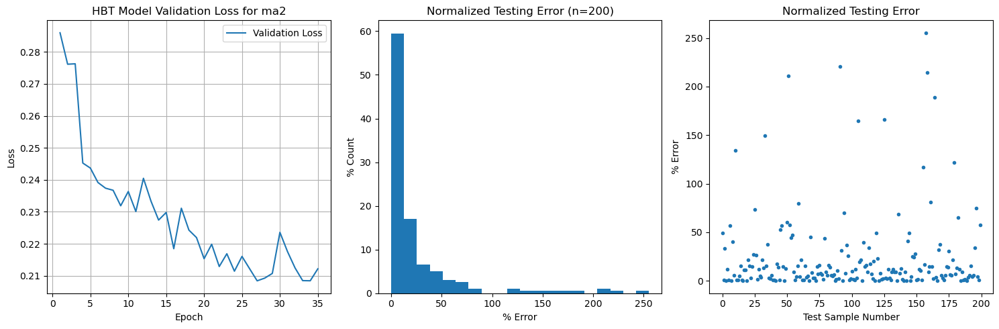

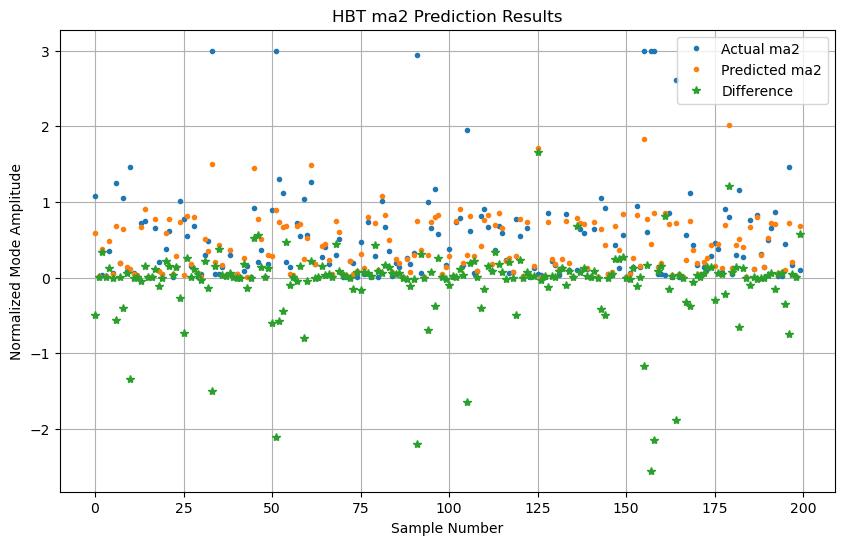

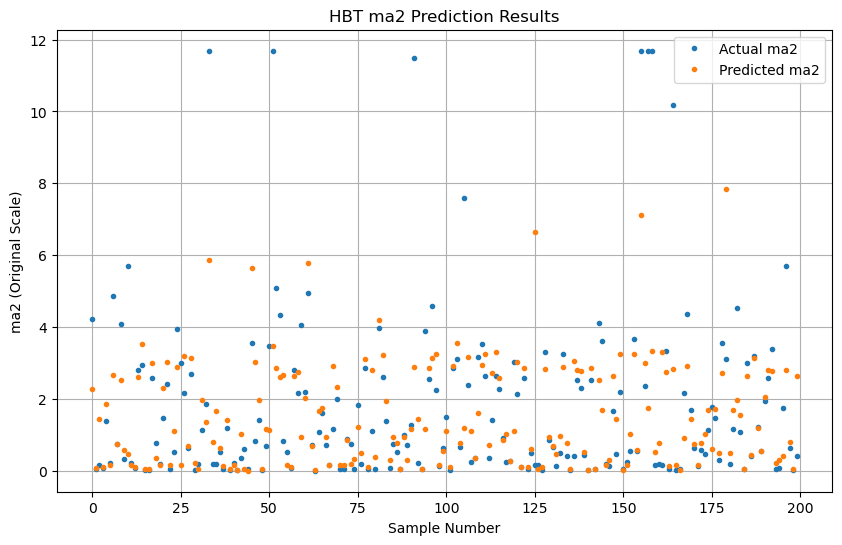

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 2.01
Mean absolute percentage error: 23.76%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

3.8972038269042963
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


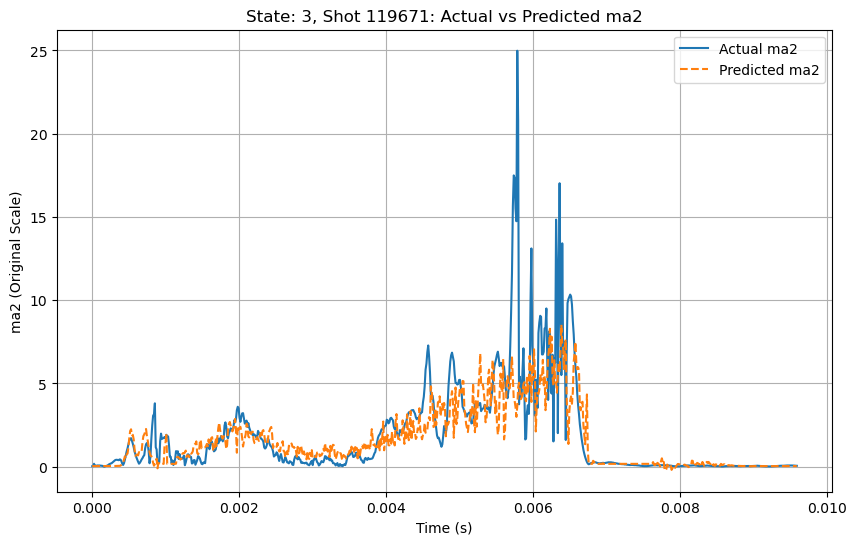

Shot 119671 - Mean absolute percentage error: 23.15%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 8.52


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
